In [0]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql import functions as F
from pyspark.sql.functions import col, to_date, when, countDistinct, count
from pyspark.sql.functions import split, explode, trim, col, lit, length
from pyspark.sql.functions import current_date, row_number, regexp_replace, coalesce
from pyspark.sql.functions import sum as spark_sum
from pyspark.sql.window import Window
import numpy as np

In [0]:
display(dbutils.fs.ls("dbfs:/FileStore/tables/"))


path,name,size,modificationTime
dbfs:/FileStore/tables/2025_03_11___DBFS_Example_Classifier.ipynb,2025_03_11___DBFS_Example_Classifier.ipynb,68203,1742053240000
dbfs:/FileStore/tables/BDM_PROJECT-1.ipynb,BDM_PROJECT-1.ipynb,5654173,1747216129000
dbfs:/FileStore/tables/BDM_PROJECT.ipynb,BDM_PROJECT.ipynb,5654173,1747215809000
dbfs:/FileStore/tables/Imdb_Movie_Dataset-1.csv,Imdb_Movie_Dataset-1.csv,392283051,1747427030000
dbfs:/FileStore/tables/Imdb_Movie_Dataset.csv,Imdb_Movie_Dataset.csv,392283051,1747217564000
dbfs:/FileStore/tables/Lab04_Notebooks.zip,Lab04_Notebooks.zip,39054,1742053197000
dbfs:/FileStore/tables/Notebook_05___Final_Streaming_Simulation_in_Community_Edition_ipynb.json,Notebook_05___Final_Streaming_Simulation_in_Community_Edition_ipynb.json,17366,1742294374000
dbfs:/FileStore/tables/Notebooks/,Notebooks/,0,0
dbfs:/FileStore/tables/github_and_env_management_notebook_02-1.ipynb,github_and_env_management_notebook_02-1.ipynb,3205,1741688859000
dbfs:/FileStore/tables/github_and_env_management_notebook_02.ipynb,github_and_env_management_notebook_02.ipynb,3205,1741688800000


In [0]:
# File location and type
file_location = "/FileStore/tables/Imdb_Movie_Dataset-1.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
# quote <-- Important to handle commas correctly
df = (
    spark.read.format(file_type)
    .option("inferSchema", infer_schema)
    .option("header", first_row_is_header)
    .option("sep", delimiter)
    .option("quote", '"')
    .option("escape", '"')
    .load(file_location)
)

display(df)

id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
27205,Inception,8.364,34495,Released,7/15/2010,825532764,148,false,160000000,tt1375666,en,Inception,"Cobb, a skilled thief who commits corporate espionage by infiltrating the subconscious of his targets is offered a chance to regain his old life as payment for a task considered to be impossible: ""inception"", the implantation of another person's idea into a target's subconscious.",83.952,Your mind is the scene of the crime.,"Action, Science Fiction, Adventure","Legendary Pictures, Syncopy, Warner Bros. Pictures","United Kingdom, United States of America","English, French, Japanese, Swahili","rescue, mission, dream, airplane, paris, france, virtual reality, kidnapping, philosophy, spy, allegory, manipulation, car crash, heist, memory, architecture, los angeles, california, dream world, subconscious"
157336,Interstellar,8.417,32571,Released,11/5/2014,701729206,169,false,165000000,tt0816692,en,Interstellar,The adventures of a group of explorers who make use of a newly discovered wormhole to surpass the limitations on human space travel and conquer the vast distances involved in an interstellar voyage.,140.241,Mankind was born on Earth. It was never meant to die here.,"Adventure, Drama, Science Fiction","Legendary Pictures, Syncopy, Lynda Obst Productions","United Kingdom, United States of America",English,"rescue, future, spacecraft, race against time, artificial intelligence (a.i.), nasa, time warp, dystopia, expedition, space travel, wormhole, famine, black hole, quantum mechanics, family relationships, space, robot, astronaut, scientist, single father, farmer, space station, curious, space adventure, time paradox, thoughtful, time-manipulation, father daughter relationship, 2060s, cornfield, time manipulation, complicated"
155,The Dark Knight,8.512,30619,Released,7/16/2008,1004558444,152,false,185000000,tt0468569,en,The Dark Knight,"Batman raises the stakes in his war on crime. With the help of Lt. Jim Gordon and District Attorney Harvey Dent, Batman sets out to dismantle the remaining criminal organizations that plague the streets. The partnership proves to be effective, but they soon find themselves prey to a reign of chaos unleashed by a rising criminal mastermind known to the terrified citizens of Gotham as the Joker.",130.643,Welcome to a world without rules.,"Drama, Action, Crime, Thriller","DC Comics, Legendary Pictures, Syncopy, Isobel Griffiths, Warner Bros. Pictures","United Kingdom, United States of America","English, Mandarin","joker, sadism, chaos, secret identity, crime fighter, superhero, anti hero, scarecrow, based on comic, vigilante, organized crime, tragic hero, anti villain, criminal mastermind, district attorney, super power, super villain, neo-noir"
19995,Avatar,7.573,29815,Released,12/15/2009,2923706026,162,false,237000000,tt0499549,en,Avatar,"In the 22nd century, a paraplegic Marine is dispatched to the moon Pandora on a unique mission, but becomes torn between following orders and protecting an alien civilization.",79.932,Enter the world of Pandora.,"Action, Adventure, Fantasy, Science Fiction","Dune Entertainment, Lightstorm Entertainment, 20th Century Fox, Ingenious Media","United States of America, United Kingdom","English, Spanish","future, society, culture clash, space travel, space war, space colony, tribe, romance, alien, futuristic, space, alien planet, marine, soldier, battle, love affair, nature, anti war, power relations, joyful"
24428,The Avengers,7.71,29166,Released,4/25/2012,1518815515,143,false,220000000,tt0848228,en,The Avengers,"When an unexpected enemy emerges and threatens global safety and security, Nick Fury, director of the international peacekeeping agency known as S.H.I.E.L.D., finds himself in need of a team to pull the world back from the brink of disast

In [0]:
# to check the total number of rows
df.count()

Out[4]: 1048575

#Data Cleaning

Can we predict the box office revenue of a movie before it is released?
This project explores that question by building a machine learning regression model using Apache Spark MLlib to predict the revenue of a movie based on features such as budget, genre, popularity, vote average, and more.


In [0]:
# To check the type of each feature
df.printSchema()


root
 |-- id: integer (nullable = true)
 |-- title: string (nullable = true)
 |-- vote_average: double (nullable = true)
 |-- vote_count: integer (nullable = true)
 |-- status: string (nullable = true)
 |-- release_date: string (nullable = true)
 |-- revenue: long (nullable = true)
 |-- runtime: integer (nullable = true)
 |-- adult: boolean (nullable = true)
 |-- budget: integer (nullable = true)
 |-- imdb_id: string (nullable = true)
 |-- original_language: string (nullable = true)
 |-- original_title: string (nullable = true)
 |-- overview: string (nullable = true)
 |-- popularity: double (nullable = true)
 |-- tagline: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- production_companies: string (nullable = true)
 |-- production_countries: string (nullable = true)
 |-- spoken_languages: string (nullable = true)
 |-- keywords: string (nullable = true)



Here we can observe that some features have entries with an incorrect or inappropriate data type for what they represent.

## Dataset Schema with Correct Types and Columns Description

| Column                  | Current Type | Correct Type      | Column Description                                                                          |
|-------------------------|--------------|-------------------|---------------------------------------------------------------------------------------------|
| id                      | integer      | integer           |A unique identifier for each movie                                                           |
| title                   | string       | string            |The name of the movie                                                                        |
| vote_average            | string       | **double** (float)|The average rating the movie has received from users (on a scale, typically from 0 to 10)    |
| vote_count              | string       | **integer**       |The total number of votes or ratings submitted for the movie                                 |
| status                  | string       | string            |The current state of the movie (e.g., "Released," "Post-Production")                         |
| release_date            | string       | **date**          |The date when the movie was officially released                                              |
| revenue                 | string       | **long** (integer)|The total earnings the movie made (usually in USD)                                           |
| runtime                 | string       | **integer**       |The duration of the movie in minutes                                                         |
| adult                   | string       | **boolean**       |Indicates whether the movie is classified as adult content (e.g., "True" or "False")          |
| budget                  | string       | **long** (integer)|The total cost of producing the movie (usually in USD)                                       |
| imdb_id                 | string       | string            |The unique identifier for the movie on IMDb (Internet Movie Database)                        |
| original_language       | string       | string            |The language in which the movie was originally produced (e.g., "en" for English)             |
| original_title          | string       | string            |The original title of the movie in its native language                                       |
| overview                | string       | string            |A brief summary or description of the movie's plot                                           |
| popularity              | string       | **double** (float)|A metric indicating how popular the movie is (typically based on views, searches, or ratings)|
| tagline                 | string       | string            |A short phrase or slogan associated with the movie                                           |
| genres                  | string       | **array<string>** |The categories or genres the movie belongs to (e.g., Action, Comedy, Drama)                  |
| production_companies    | string       | **array<string>** |production_companies: The names of the companies involved in producing the movie             |
| production_countries    | string       | **array<string>** |The countries where the movie was produced                                                   |
| spoken_languages        | string       | **array<string>** |The languages spoken in the movie                                                            |
| keywords                | string       | **array<string>** |Important terms or phrases associated with the movie, often used for categorization or search|

## Missing Values

In [0]:
# Function to calculate missing values by column
def missing_values_table_spark(df):
    """
    Calculates the total number and percentage of missing (null) values 
    for each column in a PySpark DataFrame.

    Returns a Pandas DataFrame with columns:
    - 'Column': column name
    - 'Missing Values': count of missing values
    - '% of Total Values': percentage of missing values
    
    Only columns with missing values are included, sorted in descending order.
    """
    # Calculate the total missing values for each column
    mis_val = df.select([F.sum(F.col(c).isNull().cast("int")).alias(c) for c in df.columns])

    # Convert to Pandas for easier handling
    mis_val_pd = mis_val.toPandas().transpose()

    # Calculate the percentage of missing values for each column
    mis_val_percent = (mis_val_pd[0] / df.count()) * 100

    # Create a new table combining count and percentage
    mis_val_table = pd.concat([mis_val_pd, mis_val_percent], axis=1)
    mis_val_table.columns = ['Missing Values', '% of Total Values']

    # Keep only columns with >0% missing, sort descending, round
    mis_val_table = (
        mis_val_table[mis_val_table['% of Total Values'] > 0]
        .sort_values('% of Total Values', ascending=False)
        .round(1)
    )

    # Reset index so that original column names become a column
    mis_val_table = mis_val_table.reset_index().rename(columns={'index': 'Column'})

    # Print summary
    print(f"Your selected dataframe has {len(df.columns)} columns.\n"
          f"There are {mis_val_table.shape[0]} columns that have missing values.")

    return mis_val_table

# Usage
missing_values = missing_values_table_spark(df)
display(missing_values)

Your selected dataframe has 21 columns.
There are 11 columns that have missing values.


Column,Missing Values,% of Total Values
tagline,895847,85.4
keywords,755953,72.1
production_companies,568428,54.2
imdb_id,487595,46.5
production_countries,463497,44.2
spoken_languages,440662,42.0
genres,414972,39.6
overview,215824,20.6
release_date,181817,17.3
title,13,0.0


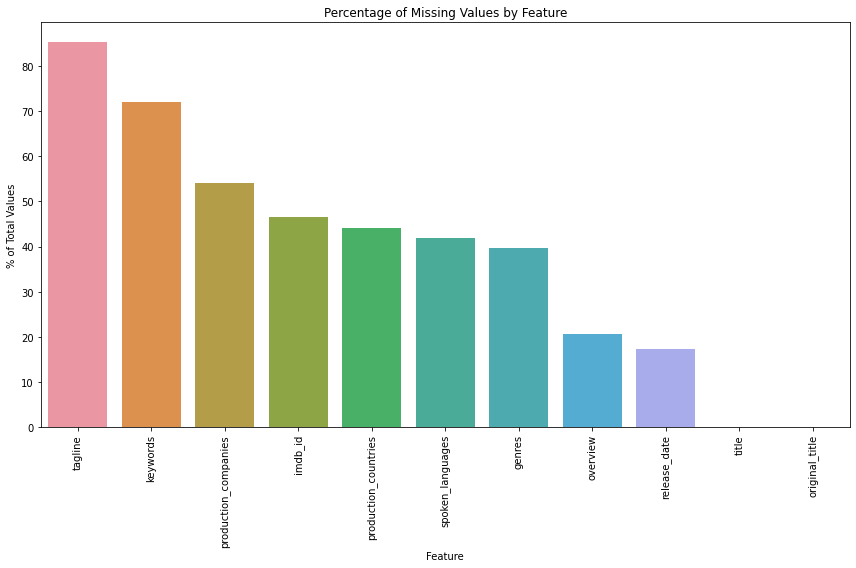

In [0]:
def plot_missing_values(mis_val_table, title):
    """
    Plots the percentage of missing values per feature, showing feature names on the x-axis.
    Assumes `mis_val_table` has a column 'Column' with the feature names and
    '% of Total Values' with the missing-value percentages.
    """
    plt.figure(figsize=(12, 8))

    # Use the 'Column' column for x-labels
    sns.barplot(
        data=mis_val_table,
        x='Column',
        y='% of Total Values'
    )

    # Rotate the x labels for better readability
    plt.xticks(rotation=90)

    # Set plot labels and title
    plt.title(title)
    plt.xlabel('Feature')
    plt.ylabel('% of Total Values')

    plt.tight_layout()
    plt.show()

# Call the function to plot the missing values with feature names shown
plot_missing_values(missing_values, title='Percentage of Missing Values by Feature')

## Zero Values

In [0]:
# Updated function to include a 'Column' column instead of using the index
def zero_values_table_spark(df):
    """
    Calculates the total number and percentage of zero values 
    for each column in a PySpark DataFrame.

    Returns a Pandas DataFrame with columns:
    - 'Column': column name
    - 'Zero Values': count of zero values
    - '% of Total Values': percentage of zero values

    Only columns with zero values are included, sorted in descending order.
    """
    # For each column, count how many values equal zero
    zero_counts = df.select([F.sum(F.when(F.col(c) == 0, 1).otherwise(0)).alias(c) for c in df.columns])

    # Convert result to Pandas for easier manipulation
    zero_counts_pd = zero_counts.toPandas().transpose()

    # Compute percentage
    row_count = df.count()
    zero_percent = (zero_counts_pd[0] / row_count) * 100

    # Create summary table
    zero_table = pd.concat([zero_counts_pd, zero_percent], axis=1)
    zero_table.columns = ['Zero Values', '% of Total Values']

    # Keep only columns with zeros, sort and round
    zero_table = (
        zero_table[zero_table['Zero Values'] > 0]
        .sort_values('% of Total Values', ascending=False)
        .round(1)
    )

    # Reset index so column names appear as a column
    zero_table = zero_table.reset_index().rename(columns={'index': 'Column'})

    # Print summary
    print(f"Your selected dataframe has {len(df.columns)} columns.\n"
          f"There are {zero_table.shape[0]} columns that have zero values.")

    return zero_table

# Use the function
zero_values = zero_values_table_spark(df)
display(zero_values)

Your selected dataframe has 21 columns.
There are 12 columns that have zero values.


Column,Zero Values,% of Total Values
revenue,1027899,98.0
budget,991807,94.6
adult,951555,90.7
vote_average,697950,66.6
vote_count,697613,66.5
runtime,293833,28.0
popularity,137908,13.2
title,43,0.0
original_title,43,0.0
overview,8,0.0


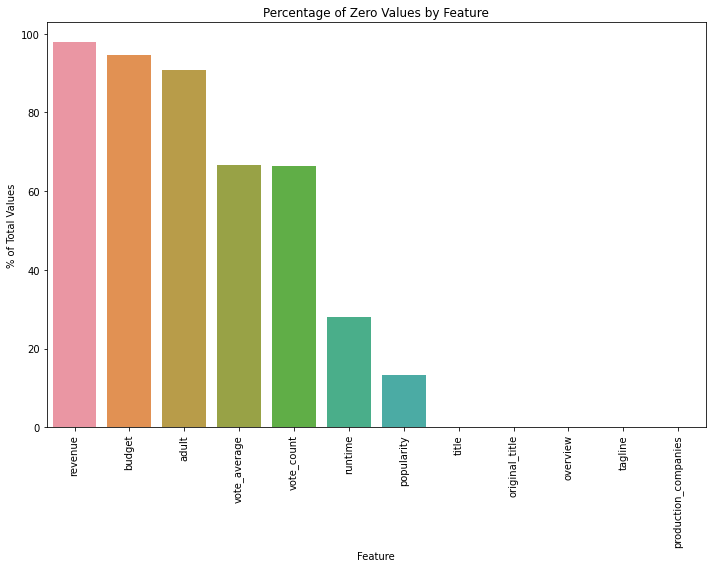

In [0]:
def plot_zero_values(zero_table, title):
    """
    Plots the percentage of zero values per feature, using the 'Column' column
    for the x-axis labels.
    """
    plt.figure(figsize=(10, 8))

    sns.barplot(
        data=zero_table,
        x='Column',
        y='% of Total Values'
    )

    # Rotate x-labels for readability
    plt.xticks(rotation=90)

    # Set labels and title
    plt.title(title)
    plt.xlabel('Feature')
    plt.ylabel('% of Total Values')

    plt.tight_layout()
    plt.show()

# print
plot_zero_values(zero_values, title='Percentage of Zero Values by Feature')

## Duplicated Records (ID and IMBD_ID features)


Our dataset contains two main identifier columns: **id** and **imdb_id**. Because of this, it's possible that duplicate values exist in either of them. In the following steps, we perform a detailed analysis to check for duplicate observations in the dataset, and, if any are found, we inspect their nature by looking at specific examples.

for **id** column

In [0]:
# Calculate total and distinct counts
total_rows = df.count()
unique_id = df.select(countDistinct("id")).collect()[0][0]

# Calculate duplicated counts
duplicated_id = total_rows - unique_id

# Print results
print(f"Total duplicated IDs: {duplicated_id}")

# Display examples of duplicated 'id' rows
dup_id_vals = (
    df
    .groupBy("id")
    .count()
    .filter(col("count") > 1)
    .select("id")
)
dup_id_rows = (
    df
    .join(dup_id_vals, on="id", how="inner")
    .orderBy("id")
)
print("Examples of duplicated 'id' rows:")
display(dup_id_rows.limit(10))

Total duplicated IDs: 794
Examples of duplicated 'id' rows:


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,null,0,0,true,0,null,en,Soldiers from Eastern Europe 6,null,0.0,null,null,null,null,null,null
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,null,0,0,true,0,null,en,Soldiers from Eastern Europe 6,null,0.0,null,null,null,null,null,null
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,4/4/2004,0,90,true,0,null,en,Soldiers from Eastern Europe 6,11 horny & hung soldiers in 5 hot scenes! You gotta love a man in uniform!,0.0,null,null,Eagle Video,Czech Republic,null,null
1192939,Soldiers from Eastern Europe 6,0.0,0,Released,4/4/2004,0,90,true,0,null,en,Soldiers from Eastern Europe 6,11 horny & hung soldiers in 5 hot scenes! You gotta love a man in uniform!,0.0,null,null,Eagle Video,Czech Republic,null,null
1192940,杀夫,0.0,0,Released,null,0,0,false,0,null,zh,杀夫,null,0.0,null,null,null,null,null,null
1192940,杀夫,0.0,0,Released,null,0,0,false,0,null,zh,杀夫,null,0.6,null,null,null,null,null,null
1192941,Ekda Yeun Tar Bagha,0.0,0,Post Production,11/24/2023,0,0,false,0,null,mr,एकदा येऊन तर बघा,upcoming marathi film,1.072,YOU WOULDN'T GO BACK,Comedy,"Ideas The Entertainment Company, SR Enterprises, Gold Mountain, Swarna Pat Katha, Group M Motion Entertainment, Kaleidoscope Cinema And Picture",India,Marathi,null
1192941,एकदा येऊन तर बघा,0.0,0,Released,null,0,0,false,0,null,en,एकदा येऊन तर बघा,upcoming marathi film,0.0,null,null,null,null,null,null
1192941,एकदा येऊन तर बघा,0.0,0,Released,null,0,0,false,0,null,en,एकदा येऊन तर बघा,upcoming marathi film,0.0,null,null,null,null,null,null
1192941,Ekda Yeun Tar Bagha,0.0,0,Post Production,11/24/2023,0,0,false,0,null,mr,एकदा येऊन तर बघा,upcoming marathi film,1.072,YOU WOULDN'T GO BACK,Comedy,"Ideas The Entertainment Company, SR Enterprises, Gold Mountain, Swarna Pat Katha, Group M Motion Entertainment, Kaleidoscope Cinema And Picture",India,Marathi,null


for **imdb_id** column

In [0]:
# Calculate counts for non-null imdb_id values
non_null_rows = df.filter(col("imdb_id").isNotNull()).count()
unique_non_null = (
    df
    .filter(col("imdb_id").isNotNull())
    .select(countDistinct("imdb_id"))
    .collect()[0][0]
)
duplicated_imdb_id = non_null_rows - unique_non_null

# Print the results
print(f"Total non-null imdb_id rows: {non_null_rows}")
print(f"Total duplicated IMDB IDs (excluding nulls): {duplicated_imdb_id}")

# Display examples of duplicated 'imdb_id' rows
dup_imdb_vals = (
    df
    .filter(col("imdb_id").isNotNull())
    .groupBy("imdb_id")
    .count()
    .filter(col("count") > 1)
    .select("imdb_id")
)

dup_imdb_rows = (
    df
    .join(dup_imdb_vals, on="imdb_id", how="inner")
    .orderBy("imdb_id")
)

print("Examples of duplicated 'imdb_id' rows:")
display(dup_imdb_rows.limit(10))


Total non-null imdb_id rows: 560980
Total duplicated IMDB IDs (excluding nulls): 1660
Examples of duplicated 'imdb_id' rows:


imdb_id,id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords
None,1410815,First Draft,8.0,1,Released,1/1/2025,0,4,false,0,en,First Draft,"Kalpana, an unfinished character, steps into reality, reflecting her creator's struggles and inspiring him to complete his story.",1.4,more than just ink on paper,Drama,null,null,English,"writer's block, fictional character comes to life"
None,1410736,Kim: Masum?,10.0,2,Released,null,1,0,false,1,tr,Kim: Masum?,null,1.4,null,null,Anka Medya,null,Turkish,null
None,1410896,New Year's Fuck,0.0,0,Released,1/16/2024,0,139,true,0,en,New Year's Fuck,"Carter Woods is back, baby. Back from a long trip, that is. And Brandon Anderson is happy to welcome him back, but when Carter discovers Brandon has feelings for him, it puts everything into a new perspective. So what's gonna happen next in New Year's Fuck? Shane Cook has a problem: he hasn't been able to get laid because his dick is just too big. So when Luke Truong offers to help Shane with his problem, things take a wild turn. It's New Years Eve and bros Roman Todd and Andrew Miller are celebrating together. But when Andrew admits that he's never had a New Year's kiss, Roman takes it upon himself to figure out a way to change that; and maybe do much more. Scott Finn just had something extremely embarrassing happen: he had a wet dream about his roommate, Diego Daniels. However, when Diego finds out, things take an unexpected twist that'll only make Scott and Diego bond even more.",0.0,null,null,Next Door Studios,United States of America,null,"tattoo, holiday, anal sex, locker room, rimming, oral sex, big dick, gay pornography, muscled men"
None,1410614,Shantanu Holmes,8.7,3,Released,1/1/2025,0,22,false,46,hi,Shantanu Holmes,Have a look in a chaotic 24-hour adventure in the life of a private investigator Shantanu Kumar••,1.4,null,Mystery,null,India,"English, Hindi",null
None,1410977,"Non piscio, sborro!",7.0,1,Released,1/1/2011,0,0,true,0,it,"Non piscio, sborro!",null,0.0,null,null,Cento X Cento,null,null,null
None,1410811,Io porca e io troia,7.0,2,Released,1/1/2011,0,0,true,0,it,Io porca e io troia,null,0.0,null,null,Cento X Cento,Italy,null,null
None,1410679,Franky,9.0,1,Released,7/5/2024,0,25,true,0,en,Franky,"In purgatory, Franky recounts his relentless, action-packed quest to avenge his girlfriend's murder, leading to a shocking confrontation.",0.0,Franky,"Action, Adventure, Thriller, Drama","Pax Films, Fictional Mannequins",null,Malayalam,"aggressive, absurd, amused"
None,1410973,Backstage,6.0,1,Released,1/1/2011,0,0,true,0,it,Backstage,null,0.0,null,null,Moonlight Video,null,null,null
None,1410970,Attenti a quelle due 2,6.0,1,Released,1/1/2011,0,0,true,0,it,Attenti a quelle due 2,null,0.0,null,null,Cento X Cento,null,null,null
None,1410583,O Diamante,10.0,1,Released,10/11/2024,0,0,false,0,pt,O Diamante,null,0.92,null,"Comedy, Animation, Drama","Velvet Produção, Grizzly Filmes",Brazil,null,null


Turns out that the duplicated rows by **id** column are in fact duplicates. 
- We will deduplicate and leave only the row with the lest number of null values.

When it comes to **imdb_id**, those also concern the same movies but with original and translated titles. 
- We will deduplicate using the same logic as we used with **id**


## Summary

### Missing Values
These columns have significant number of null entries:
- **tagline** (85.4% missing)  
- **keywords** (72.1% missing)  
- **production_companies** (54.2% missing)
- **imdb_id** (46.5% missing)  
- **production_countries** (44.2% missing)  
- **spoken_languages** (~42% missing)  
- **genres** (39.6% missing)  
- **overview** (20.6% missing)  
- **release_date** (17.3% missing)

### Zero Values
The following columns contain a substantial fraction of zeros:
- **revenue** (98% zeros)  
- **budget** (94.6% zeros)  
- **adult** (90.7% zeros)
- **vote average** (66.6% zeros)
- **vote_count** (66.5%)   
- **runtime** (28% zeros) 
- **popularity** (13.2% zeros)

### Duplicated Records
The dataset contains 794 duplicate entries with the same **id**, and also several duplicates based on **imdb_id**, many of which have a high number of _null_ values.

## Fixing Data Types

First of all, we need to fix the data types of some features, otherwise they won't be useful for our project modeling.
In this step, we will correct all data types except for the **release_date** feature, as we need to perform some additional analysis on it first.

In [0]:
# Cast revenue and budget to long (64-bit integer)
df = df.withColumn(
        "vote_average", col("vote_average").cast("double")
    ).withColumn(
        "vote_count", col("vote_count").cast("integer")
    ).withColumn(
        "revenue", col("revenue").cast("long")
    ).withColumn(
        "runtime", col("runtime").cast("integer")
    ).withColumn(
        "adult", col("adult").cast("boolean")
    ).withColumn(
        "budget", col("budget").cast("long")
    ).withColumn(
        "popularity", col("popularity").cast("double")
    ).withColumn(
        "genres_array", split(col("genres"), ",\\s*")
    ).withColumn(
        "production_companies", split(col("production_companies"), ",\\s*")
    ).withColumn(
        "production_countries", split(col("production_countries"), ",\\s*")
    ).withColumn(
        "spoken_languages", split(col("spoken_languages"), ",\\s*")
    ).withColumn(
        "keywords", split(col("keywords"), ",\\s*")
    )


# Verify that the types have been updated
df.printSchema()

root
 |-- id: integer (nullable = true)
 |-- title: string (nullable = true)
 |-- vote_average: double (nullable = true)
 |-- vote_count: integer (nullable = true)
 |-- status: string (nullable = true)
 |-- release_date: string (nullable = true)
 |-- revenue: long (nullable = true)
 |-- runtime: integer (nullable = true)
 |-- adult: boolean (nullable = true)
 |-- budget: long (nullable = true)
 |-- imdb_id: string (nullable = true)
 |-- original_language: string (nullable = true)
 |-- original_title: string (nullable = true)
 |-- overview: string (nullable = true)
 |-- popularity: double (nullable = true)
 |-- tagline: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- production_companies: array (nullable = true)
 |    |-- element: string (containsNull = false)
 |-- production_countries: array (nullable = true)
 |    |-- element: string (containsNull = false)
 |-- spoken_languages: array (nullable = true)
 |    |-- element: string (containsNull = false)
 |-- keywords:

## Fixing Duplicate Records (ID and IMBD_ID features)

Here, as previously mentioned in the section where we identified the presence of outliers, we will now deal with them. In order to properly handle the duplicates found in our two identifier columns, we first need to ensure that missing values are correctly represented. Specifically, we will count and replace, if present, the string *'None'* with the actual *None* (*null*) value in the **imdb_id** column.

In [0]:
# Count how many "None" strings are in imdb_id
none_count = df.filter(col("imdb_id") == "None").count()

# Replace "None" strings with actual nulls
df = df.withColumn(
    "imdb_id",
    when(col("imdb_id") == "None", None)
      .otherwise(col("imdb_id"))
)

# Print how many values were set to null
print(f"Number of 'None' values replaced with null in 'imdb_id': {none_count}")


Number of 'None' values replaced with null in 'imdb_id': 408


This section is where we identified the presence of duplicates, we will now deal with them.

In [0]:
def drop_duplicates_keep_least_null(df, id_col="id"):
    """
    Remove duplicate rows among those with non-null `id_col`, keeping the row with the fewest null values.
    Rows where `id_col` is null are left untouched.
    Prints how many rows were dropped among non-null IDs.
    """
    # Split into rows with and without an ID
    non_null_df = df.filter(col(id_col).isNotNull())
    null_df     = df.filter(col(id_col).isNull())
    
    # Count non-null rows before deduplication
    orig_count = non_null_df.count()
    
    # For each row, count how many columns are null
    null_count_expr = sum(
        when(col(c).isNull(), 1).otherwise(0) for c in non_null_df.columns
    ).alias("_null_count")
    nn_with_nulls = non_null_df.withColumn("_null_count", null_count_expr)
    
    # Within each id group, rank rows by null_count ascending
    window = Window.partitionBy(id_col).orderBy(col("_null_count").asc())
    ranked = nn_with_nulls.withColumn("_rn", row_number().over(window))
    
    # Keep only the first row for each id (fewest nulls), drop helper cols
    deduped_non_null = (
        ranked
        .filter(col("_rn") == 1)
        .drop("_null_count", "_rn")
    )
    
    # Count how many non-null rows were dropped
    new_count = deduped_non_null.count()
    dropped = orig_count - new_count
    print(f"Dropped {dropped} duplicate rows among non-null '{id_col}'.")
    
    # Combine back with the untouched null-ID rows
    result_df = deduped_non_null.unionByName(null_df)
    return result_df

# Use the function to deduplicate by "id", preserving rows with null id
df = drop_duplicates_keep_least_null(df, id_col="id")

display(df.limit(10))

Dropped 794 duplicate rows among non-null 'id'.


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array
12,Finding Nemo,7.824,18061,Released,5/30/2003,940335536,100,false,94000000,tt0266543,en,Finding Nemo,"Nemo, an adventurous young clownfish, is unexpectedly taken from his Great Barrier Reef home to a dentist's office aquarium. It's up to his worrisome father Marlin and a friendly but forgetful fish Dory to bring Nemo home -- meeting vegetarian sharks, surfer dude turtles, hypnotic jellyfish, hungry seagulls, and more along the way.",55.456,There are 3.7 trillion fish in the ocean. They're looking for one.,"Animation, Family",List(Pixar),List(United States of America),List(English),"List(sydney, australia, parent child relationship, anthropomorphism, harbor, underwater, shark, pelican, fish tank, great barrier reef, sea turtle, missing child, aftercreditsstinger, duringcreditsstinger, short term memory loss, clownfish, father son reunion, protective father)","List(Animation, Family)"
26,Walk on Water,6.9,80,Released,2/5/2004,444,103,false,1400000,tt0352994,he,LaLehet Al HaMayim,"Eyal, an Israeli Mossad agent, is given the mission to track down and kill the very old Alfred Himmelman, an ex-Nazi officer, who might still be alive. Pretending to be a tourist guide, he befriends his grandson Axel, in Israel to visit his sister Pia. The two men set out on a tour of the country, during which Axel challenges Eyal's values.",5.316,He was trained to hate until he met the enemy.,Drama,"List(Lama Films, United King Films)","List(Israel, Sweden)","List(English, Arabic, Hebrew, German, Turkish, Italian)","List(israel, palestinian-israeli conflict, berlin, germany, neo-nazism, chauffeur, dead sea, mossad, nazi, homophobia, jerusalem, israel, gay club, anti-semitism, kibbutz, suicide mission, lgbt, gay theme)",List(Drama)
27,9 Songs,5.653,462,Released,7/16/2004,1574623,69,false,1000000,tt0411705,en,9 Songs,"Matt, a young glaciologist, soars across the vast, silent, icebound immensities of the South Pole as he recalls his love affair with Lisa. They meet at a mobbed rock concert in a vast music hall - London's Brixton Academy. They are in bed at night's end. Together, over a period of several months, they pursue a mutual sexual passion whose inevitable stages unfold in counterpoint to nine live-concert songs.",30.475,"2 lovers, one summer, and the 9 songs that defined them.","Drama, Music, Romance",List(Revolution Films),List(United Kingdom),List(English),"List(london, england, concert, rock 'n' roll, sexuality, orgasm, cocaine, man woman relationship, condom, love, sexual fantasy, pubic hair, breast, ejaculation, american, couple, desire, sexual desire, cunnilingus, naked, exchange student, rock concert, british man, nude, drug, small tits, woman tied to a bed, sex, sexual, vulva, rock, unsimulated sex, intense, fellatio, tied to a bed, erect penis, small breasts, blowjob)","List(Drama, Music, Romance)"
28,Apocalypse Now,8.282,7485,Released,8/15/1979,150000000,147,false,31500000,tt0078788,en,Apocalypse Now,"At the height of the Vietnam war, Captain Benjamin Willard is sent on a dangerous mission that, officially, ""does not exist, nor will it ever exist."" His goal is to locate - and eliminate - a mysterious Green Beret Colonel named Walter Kurtz, who has been leading his personal army on illegal guerrilla missions into enemy territory.",37.715,This is the end...,"Drama, War","List(United Artists, American Zoetrope)",List(United States of America),"List(Khmer, English, French, Vietnamese)","List(guerrilla warfare, epic, vietnam war, journalist, mission, vietnam, vietcong, cia, cambodia, army, drug abuse, based on novel or book, secret mission, insanity, surrealism, tribe, green beret, jungle, descent into madness, brutality, riverboat, military, anti war)","List(Drama, War)"
65,8 Mile,7.124,6692,Released,11/

In [0]:
# Now drop duplicates by imdb_id
df = drop_duplicates_keep_least_null(df, id_col="imdb_id")

# Inspect a few rows to confirm
display(df.limit(10))

Dropped 1002 duplicate rows among non-null 'imdb_id'.


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array
16613,Clown and His Dogs,4.7,10,Released,1892-10-28,0,10,false,0,tt0000002,fr,Clown et ses chiens,Short film of 300 individually painted images.,2.072,null,Animation,null,List(France),List(No Language),"List(clown, dog, silent film, 19th century, circus act, short film, théâtre optique, les pantomimes lumineuses)",List(Animation)
16622,A Good Beer,4.0,8,Released,1892-10-28,0,15,false,0,tt0000004,fr,Un bon bock,null,1.168,null,Animation,null,List(France),List(No Language),"List(19th century, short film, théâtre optique, les pantomimes lumineuses)",List(Animation)
105158,Edison Kinetoscopic Record of a Sneeze,4.859,78,Released,1894-01-09,0,1,false,0,tt0000008,xx,Edison Kinetoscopic Record of a Sneeze,A man (Thomas Edison's assistant) takes a pinch of snuff and sneezes. This is one of the earliest Thomas Edison films and was the first motion picture to be copyrighted in the United States.,3.077,null,Documentary,List(Edison Studios),List(United States of America),List(No Language),null,List(Documentary)
208234,The Photographical Congress Arrives in Lyon,5.366,82,Released,1895-06-12,0,1,false,0,tt0000013,fr,Le débarquement du congrès de photographie à Lyon,"Down the gangway, photographers leave the deck of a riverboat in large numbers.",3.358,null,Documentary,List(Lumière),List(France),List(No Language),null,List(Documentary)
159896,Autour d’une cabine,5.833,48,Released,1894-12-15,0,2,false,0,tt0000015,dz,Autour d’une cabine,The film consists of a series of animations on a beach containing two beach huts and a diving board. Two characters play at diving into the water from the diving board and then appear on the beach. The woman begins to play with a small dog and is then joined by a gentleman. The two play around on the beach before getting changed into bathing costumes and going into the water. They bob up and down in the water before swimming out of the scene. Once the couple have gone a man sails out in a boat.,2.466,null,Animation,null,List(France),List(No Language),"List(19th century, short film, théâtre optique, les pantomimes lumineuses)",List(Animation)
194081,Italienischer Bauerntanz,4.056,18,Released,1895-11-01,0,1,false,0,tt0000017,de,Italienischer Bauerntanz,"Two children, Ploetz and Larella, perform an Italian peasant dance.",1.001,null,Documentary,null,List(Germany),"List(German, No Language)","List(dance, silent film)",List(Documentary)
415406,The Clown Barber,1.0,1,Released,1898-08-01,0,1,false,0,tt0000019,en,The Clown Barber,A clown cuts off a customer's head and replaces it.,0.6,null,Comedy,List(Williamson Kinematograph Company),List(United Kingdom),null,List(silent film),List(Comedy)
127777,The Blacksmiths,5.052,67,Released,1895-12-28,0,1,false,0,tt0000022,fr,Les forgerons,"While his aide continuously turns the handle of the bellows, keeping hot a small furnace in front of him, a blacksmith is pounding a piece of metal on an anvil, then plunges the shaft into a tub of water, causing a cloud of vapor in the process.",2.701,null,Documentary,List(Lumière),List(France),List(No Language),"List(remake, silent film)",List(Documentary)
127792,Cordeliers' Square in Lyon,5.369,61,Released,1895-12-28,0,1,false,0,tt0000027,fr,Place des Cordeliers à Lyon,"Pedestrian and horse-drawn vehicles traffic, across the Place des Cordeliers, in Lyon.",2.751,null,Documentary,List(Lumière),List(France),List(No Language),null,List(Documentary)
127764,Fishing for Goldfish,4.903,62,Released,1895-12-28,0,1,false,0,tt0000028,fr,La Pêche aux poissons rouges,"A man, holding a baby up in his hands, is standing next to a fishbowl. The baby is trying, in vain, to catch a goldfish with his bare hands.",2.471,null,Documentary,List(Lumière),List(France),List(No Language),List(silent film),List(Documentary)


In [0]:
# Sanity check - recalculate duplicates
# Total rows
total_rows = df.count()

# id duplicates (id never null)
unique_id = df.select(countDistinct("id")).collect()[0][0]
duplicated_id = total_rows - unique_id

# imdb_id duplicates (exclude null/"None")
valid_imdb = df.filter(col("imdb_id").isNotNull() & (col("imdb_id") != "None"))
total_valid = valid_imdb.count()
unique_imdb = valid_imdb.select(countDistinct("imdb_id")).collect()[0][0]
duplicated_imdb_id = total_valid - unique_imdb

print(f"Total duplicated IDs: {duplicated_id}")
print(f"Total duplicated IMDB IDs (excluding nulls): {duplicated_imdb_id}")


Total duplicated IDs: 0
Total duplicated IMDB IDs (excluding nulls): 0


Now, **id** and **imdb_id** columns are deduplicated. Their datatype is correct, so no need for further changes.

## Numerical Feature Analysis

### First cleaning (REVENUE and BUDGET)

As we mentioned earlier, one of the main issues with our dataset is that the revenue and budget features contain a very high percentage of zero values. Because of this, we need to address the problem, otherwise, we would be working with a massive dataset that is hard to run efficiently in Databricks and may lead to inconclusive results.

We need to filter or reduce the dataset. While this is technically a big data problem (we have many entries), in practice, we'll only work with a meaningful subset. This is not only for efficiency and performance reasons but also because we want to use revenue as our target variable and if 98% of our dataset has zero revenue, training a model on all of it would introduce a strong bias and hurt the model's ability to learn meaningful patterns. We would essentially be training on noise.

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for revenue and budget
total = df.count()

for cname in ["revenue", "budget"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") |(col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    zeros   = df.filter(col(cname) == 0).count()
    
    print(
        f"{cname}: total={total}, "
        f"nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}, "
        f"zeros={zeros}"
    )

revenue: total=1046779, nulls=0, empty strings=0, 'None'/'none' strings=0, zeros=1026123
budget: total=1046779, nulls=0, empty strings=0, 'None'/'none' strings=0, zeros=990155


Now, we will drop the rows where **revenue** == 0.

In [0]:
# Count total rows before filtering
initial_count = df.count()

# Filter to only movies with revenue > 0
df = df.filter(col("revenue").isNotNull() & (col("revenue") > 0))

# Count rows after filtering
final_count = df.count()

# Compute how many were dropped
dropped_count = initial_count - final_count

# Report
print(f"Dropped {dropped_count} movies with zero or null revenue.")
print(f"Remaining movies for training: {final_count}")

Dropped 1026124 movies with zero or null revenue.
Remaining movies for training: 20655


We drop all movies with revenue == 0 because in our dataset those zeroes overwhelmingly represent missing or unreported box-office figures—not true earnings—and including them would force the model to learn spurious patterns tied to data availability rather than actual revenue drivers. By training only on films with known, positive revenue, we ensure the regression learns genuine relationships (e.g. between budget, popularity, genre, etc.) and avoids biasing predictions toward “zero” whenever it encounters features associated with unreleased or untracked titles.

ploting the origianl distributions

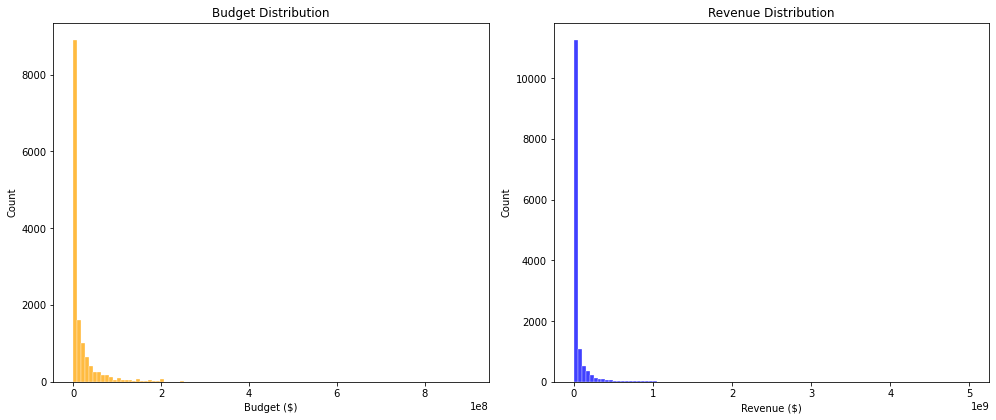

In [0]:
# Filter 
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Select and convert necessary columns to Pandas
df_money_pd = df_money.select("budget", "revenue").toPandas()

# Plot original distributions
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
sns.set(style="whitegrid")

# Budget distribution
sns.histplot(df_money_pd['budget'], bins=100, ax=axes[0], color='orange')
axes[0].set_title('Budget Distribution')
axes[0].set_xlabel('Budget ($)')
axes[0].set_ylabel('Count')

# Revenue distribution
sns.histplot(df_money_pd['revenue'], bins=100, ax=axes[1], color='blue')
axes[1].set_title('Revenue Distribution')
axes[1].set_xlabel('Revenue ($)')
axes[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

ploting with the log10 transformation

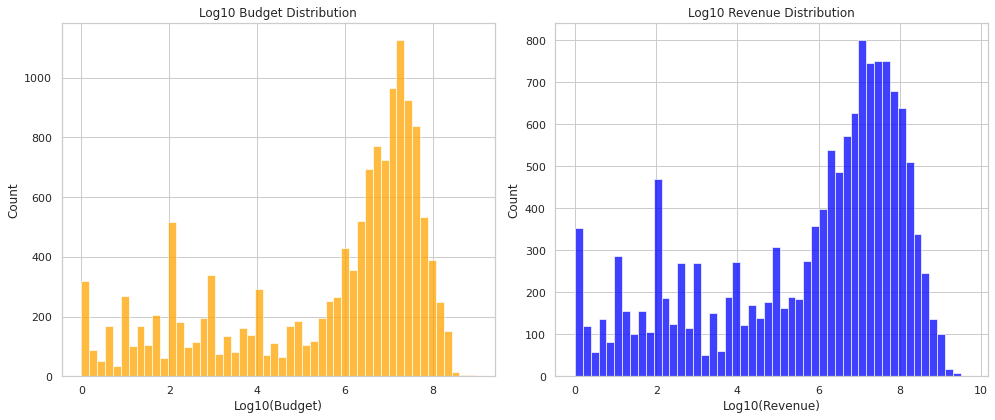

In [0]:
# Filter Spark DataFrame for positive budget and revenue
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Convert to Pandas
df_money_pd = df_money.select("budget", "revenue").toPandas()

# Apply log10 transformation
df_money_pd['log_budget'] = np.log10(df_money_pd['budget'])
df_money_pd['log_revenue'] = np.log10(df_money_pd['revenue'])

# Plot
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.histplot(df_money_pd['log_budget'], bins=50, ax=axes[0], color='orange')
axes[0].set_title('Log10 Budget Distribution')
axes[0].set_xlabel('Log10(Budget)')

sns.histplot(df_money_pd['log_revenue'], bins=50, ax=axes[1], color='blue')
axes[1].set_title('Log10 Revenue Distribution')
axes[1].set_xlabel('Log10(Revenue)')

plt.tight_layout()
plt.show()

Budget and Revenue (log₁₀) Distributions

Log₁₀(Budget)
The bulk of film budgets cluster around log₁₀(budget) ≈ 6.5–7.5, i.e. budgets of roughly \$3 million to \$30 million. Most budgets fall between log₁₀ ≈ 5 (≈ \$100 k) and log₁₀ ≈ 8 (≈ \$100 million). There is a long left‐hand tail extending down toward zero (very low‐budget or no‐budget films), and a shorter right tail tapering off beyond log₁₀ ≈ 8. Small peaks around log₁₀ ≈ 2–3 (\$100–\$1 000 budgets) and log₁₀ ≈ 4–5 (\$10 000–\$100 000) likely correspond to micro‐budget productions.

Log₁₀(Revenue)
Revenues tend to concentrate around log₁₀(revenue) ≈ 7–8, i.e. \$10 million to \$100 million. Revenues span from very low figures (log₁₀ ≈ 0–2, under \$100–\$100) up to blockbuster grosses (log₁₀ ≈ 9+, over \$1 billion), though the extreme high end thins out sharply. The distribution is right‐skewed, with a heavy left tail of low‐earning films and a tapering right tail of big‐blockbusters. A visible bump near log₁₀ ≈ 4–5 (\$10 000–\$100 000) suggests a cluster of modest indie releases, and occasional spikes around log₁₀ ≈ 2 (\$100–\$1 000) reflect very small‐scale runs or data artifacts.

Overall, both distributions are left-skewed on the log scale, with most films clustering in the mid‐range budgets and revenues, but with long tails toward both the ultra‐low and the ultra‐high ends.

In [0]:
# Movies with revenue == 0 but budget != 0
zero_rev_nonzero_budget = df.filter((col("revenue") == 0) & (col("budget") != 0))
count_zero_rev_nonzero_budget = zero_rev_nonzero_budget.count()
print(f"Movies with revenue = 0 and budget != 0: {count_zero_rev_nonzero_budget}")
display(zero_rev_nonzero_budget.limit(5))

# Movies with budget == 0 but revenue != 0
zero_budget_nonzero_rev = df.filter((col("budget") == 0) & (col("revenue") != 0))
count_zero_budget_nonzero_rev = zero_budget_nonzero_rev.count()
print(f"Movies with budget = 0 and revenue != 0: {count_zero_budget_nonzero_rev}")
display(zero_budget_nonzero_rev.limit(5))

Movies with revenue = 0 and budget != 0: 0


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array


Movies with budget = 0 and revenue != 0: 6505


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array
174104,The Spoilers,6.2,3,Released,4/10/1914,4100000,110,false,0,tt0004630,en,The Spoilers,"The Spoilers is a 1914 film directed by Colin Campbell. It is set in Nome, Alaska during the 1898 Gold Rush, with William Farnum as Roy Glennister, Kathlyn Williams as Cherry Malotte, and Tom Santschi as Alex McNamara. The film culminates in a spectacular saloon fistfight between Glennister and McNamara. It was adapted to screen by Lanier Bartlett from the Rex Beach novel of the same name.",0.6,null,"Romance, Western",List(Selig Polyscope Company),List(United States of America),null,"List(alaska, silent film, nome alaska, saloon brawl, klondike gold rush, partially lost film)","List(Romance, Western)"
899,Broken Blossoms,6.874,199,Released,5/13/1919,2400000,89,false,0,tt0009968,en,Broken Blossoms,The love story of an abused English girl and a Chinese Buddhist in a time when London was a brutal and harsh place to live.,7.716,A Tale of Forbidden Love,"Drama, Romance","List(D.W. Griffith Productions, United Artists)",List(United States of America),List(No Language),"List(suicide, london, england, china, boxer, buddhist, murder, racism, black and white, alcoholic, silent film, based on short story)","List(Drama, Romance)"
643,Battleship Potemkin,7.64,1034,Released,12/24/1925,45100,75,false,0,tt0015648,ru,Броненосец Потёмкин,"A dramatized account of a great Russian naval mutiny and a resultant public demonstration, showing support, which brought on a police massacre. The film had an incredible impact on the development of cinema and is a masterful example of montage editing.",19.558,"Revolution is the only lawful, equal, effectual war. It was in Russia that this war was declared and begun.","Drama, History, War","List(Mosfilm, Goskino USSR)",List(Soviet Union),List(No Language),"List(panic, baby carriage, cossack, slaughter, massacre, rage, sailor, silent film, russian revolution (1917), revolt, imperial russia, insubordination, port city, soviet realism, maggots)","List(Drama, History, War)"
545359,The Dressmaker from Paris,0.0,0,Released,3/30/1925,181,80,false,0,tt0015765,en,The Dressmaker from Paris,An American soldier falls in love with a French maiden but their romance is thwarted when the Yanks return home. Years later she comes to America to put on a fashion show and find her long lost lover.,1.371,null,null,null,null,null,List(silent film),null
141914,Stella Dallas,7.1,12,Released,11/16/1925,1500000,110,false,0,tt0016395,en,Stella Dallas,"An eccentric lower class woman struggles to gain respect in high society after marrying a wealthy man, and the problem gets worse when their daughter starts growing up.",1.953,null,Drama,List(Samuel Goldwyn Productions),List(United States of America),List(No Language),List(silent film),List(Drama)


Here we can observe that some movies had zero budget but still generated revenue. At first, this may seem strange, but it makes sense when we consider, for example, that many animated films or productions have very low or zero production costs and can still achieve substantial profits.

In [0]:
# Movies with negative budget
neg_budget_count = df.filter(col("budget") < 0).count()
print(f"Number of movies with negative budget: {neg_budget_count}")

#  Movies with negative revenue
neg_revenue_count = df.filter(col("revenue") < 0).count()
print(f"Number of movies with negative revenue: {neg_revenue_count}")
display(df.filter(col("revenue") < 0))


Number of movies with negative budget: 0
Number of movies with negative revenue: 0


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array


### VOTE_AVERAGE and VOTE_COUNT

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for vote_average and vote_count
total = df.count()

for cname in ["vote_average", "vote_count"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") | (col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    
    print(
        f"{cname}: total={total}, "
        f"nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}"
    )

vote_average: total=20655, nulls=0, empty strings=0, 'None'/'none' strings=0
vote_count: total=20655, nulls=0, empty strings=0, 'None'/'none' strings=0


In [0]:
# Count instances where vote_average == 0
count_avg_zero = df.filter(col("vote_average") == 0).count()
print(f"Number of rows with vote_average == 0: {count_avg_zero}")

# Count instances where vote_count == 0
count_count_zero = df.filter(col("vote_count") == 0).count()
print(f"Number of rows with vote_count == 0: {count_count_zero}")

Number of rows with vote_average == 0: 3878
Number of rows with vote_count == 0: 3871


IMDb’s user rating system allows you to assign any whole-number score from 1 (the lowest) up to 10 (the highest) for any movie.

In [0]:
# Movies with vote_average below the allowed minimum (1)
below_allowed = df.filter(col("vote_average") < 1)
count_below = below_allowed.count()
print(f"Number of movies with vote_average below 1: {count_below}")

# Movies with vote_average above the allowed maximum (10)
above_allowed = df.filter(col("vote_average") > 10)
count_above = above_allowed.count()
print(f"Number of movies with vote_average above 10: {count_above}")

Number of movies with vote_average below 1: 3881
Number of movies with vote_average above 10: 0


In [0]:
# Replace those invalid vote_average values with null
df = df.withColumn(
    "vote_average",
    when(col("vote_average") < 1, None)
     .otherwise(col("vote_average"))
)

# Verify none remain
remaining_invalid = df.filter(col("vote_average") < 1).count()
print(f"Remaining vote_average < 1 after cleanup: {remaining_invalid}")

Remaining vote_average < 1 after cleanup: 0


In [0]:
# Movies where vote_count == 0 but vote_average != 0
cond = df.filter((col("vote_count") == 0) & (col("vote_average") != 0))
count = cond.count()
print(f"Number of movies with vote_count == 0 and vote_average != 0: {count}")
# Display all columns for a few examples
display(cond.limit(5))

Number of movies with vote_count == 0 and vote_average != 0: 4


id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array
334418,Women,7.0,0,Released,1/2/1996,9225,98,false,0,tt0117152,en,נשים,"Love, family expectations, and religion mix in 19th century Jerusalem. Jacob and Rebecca marry; he's a rabbi, she's dutiful and loving. But she has no children. Months become years. Although Jacob is content, his mother reminds everyone she is waiting for a grandson. After 15 years, Rebecca determines that Jacob must take an additional wife, the young and beautiful Sultana. Rebecca fasts and prays, and in a state of near ecstasy, persuades everyone involved and then arranges an elaborate wedding. However, Sultana does not conceive, and Rebecca watches helplessly as Jacob's affection shifts to Sultana. She's near madness and the household is in turmoil. What can Rebecca do now?",0.613,null,Drama,null,List(Israel),List(Hebrew),null,List(Drama)
1055969,湘西剿匪记 上集,10.0,0,Released,1/1/1987,100,0,false,100,tt16085732,zh,湘西剿匪记 上集,null,0.6,null,War,List(潇湘电影制片厂),List(China),List(Mandarin),null,List(War)
1328606,Skeye Hallelujah Cover,7.0,0,Released,12/6/2010,1000,6,false,1000,null,en,Skeye Hallelujah Cover,The Cover of Leonard Cohen's Hallelujah by Skeye,0.6,Hallelujah,"Music, Drama",List(Vektormusic),null,null,null,"List(Music, Drama)"
383008,真爱,8.0,0,Released,5/22/2014,151853,105,false,0,null,zh,真爱,"The story takes place in Qinghe Altay, Xinjiang, a small county surrounded by mountains. Wang Caixia, a little girl in rags and with an abscess on her head was looking for her lost elder brother Wang Yunhui. She was so lonely and homeless that Anipha adopted her. Now Anipha and Abibo have 19 kids in their family, but they still fight on with hope.",0.844,null,"Drama, Family",List(Tianshan Film Studio),List(China),List(Mandarin),List(big family),"List(Drama, Family)"


In [0]:
# Count how many rows have vote_count == 0
zero_count = df.filter(col("vote_count") == 0).count()
print(f"Found {zero_count} rows with vote_count == 0; setting vote_average to null for these.")

# Replace vote_average with null where vote_count is zero
df = df.withColumn(
    "vote_average",
    when(col("vote_count") == 0, None)
     .otherwise(col("vote_average"))
)

# Verify that no row with vote_count == 0 still has a non-null vote_average
remaining = df.filter((col("vote_count") == 0) & col("vote_average").isNotNull()).count()
print(f"Remaining rows with vote_count == 0 and non-null vote_average: {remaining}")

Found 3871 rows with vote_count == 0; setting vote_average to null for these.
Remaining rows with vote_count == 0 and non-null vote_average: 0


In [0]:
# Examples where vote_average == 0
count_avg_zero = df.filter(col("vote_average") == 0).count()
print(f"Number of rows with vote_average == 0: {count_avg_zero}")

# Examples where vote_count == 0
count_count_zero = df.filter(col("vote_count") == 0).count()
print(f"Number of rows with vote_count == 0: {count_count_zero}")

Number of rows with vote_average == 0: 0
Number of rows with vote_count == 0: 3871


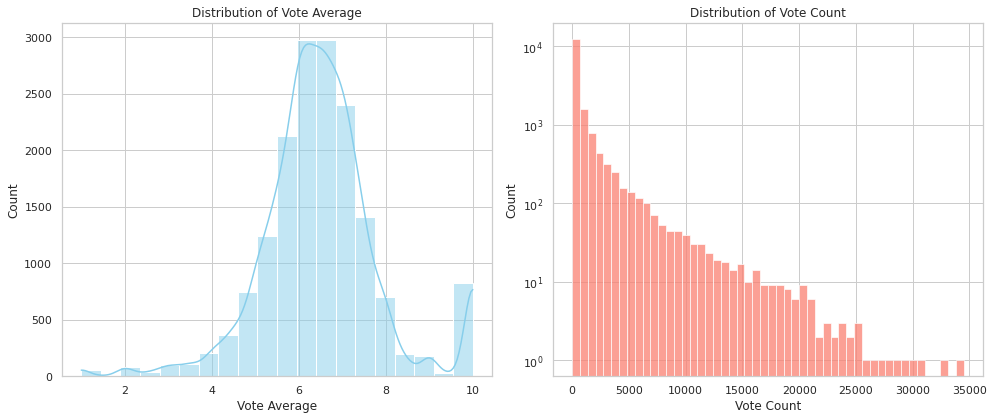

In [0]:
# Convert only the needed columns to Pandas to avoid memory issues
df_plot = df.select("vote_average", "vote_count").dropna().toPandas()

# Set seaborn style
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot vote_average histogram
sns.histplot(df_plot['vote_average'], bins=20, kde=True, ax=axes[0], color='skyblue')
axes[0].set_title('Distribution of Vote Average')
axes[0].set_xlabel('Vote Average')
axes[0].set_ylabel('Count')

# Plot vote_count histogram (log scale)
sns.histplot(df_plot['vote_count'], bins=50, kde=False, ax=axes[1], color='salmon')
axes[1].set_title('Distribution of Vote Count')
axes[1].set_xlabel('Vote Count')
axes[1].set_ylabel('Count')
axes[1].set_yscale('log')  # log scale for better readability of skewed data

plt.tight_layout()
plt.show()

The distribution for **vote_average** looks almost normal, with a bump around 5 and 6–7, which aligns with typical average ratings on platforms like IMDb or TMDB.

When it comes to **vote_count**, there's a long tail of movies with thousands of votes, likely the popular ones. However, a big portion of movies did not receive any votes.

### Save Checkpoint 1

Since Databricks imposes limitations on the active runtime of clusters to execute our code, we define checkpoints throughout the process where we save the progress achieved so far. This allows us to optimize execution and avoid repeating previous steps.

The columns **id**, **imdb_id**, **revenue**, **budget**, **vote_average**, and **vote_count** have already been analyzed and processed.

In [0]:
# to save our dataset
df.write.mode("overwrite").parquet("/FileStore/tables/Imdb_Movie_Dataset-1.csv")
display(df)

In [0]:
# import again the librarys
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.sql import functions as F
from pyspark.sql.functions import col, to_date, when, countDistinct, count
from pyspark.sql.functions import split, explode, trim, col, lit, length
from pyspark.sql.functions import current_date, row_number, regexp_replace, coalesce
from pyspark.sql.functions import sum as spark_sum
from pyspark.sql.window import Window
import numpy as np

In [0]:
# to read the data set with previous tranformations
df = spark.read.parquet("/FileStore/tables/Imdb_Movie_Dataset-1.csv")
display(df)

id,title,vote_average,vote_count,status,release_date,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array
30266,"20,000 Leagues Under the Sea",6.3,48,Released,12/24/1916,8000000,85,false,200000,tt0006333,en,"20,000 Leagues Under the Sea","Captain Nemo has built a fantastic submarine for his mission of revenge. He has traveled over 20,000 leagues in search of Charles Denver - a man who caused the death of Princess Daaker. Seeing what he had done, Denver took the daughter to his yacht and sailed away.",3.474,The First Submarine Photoplay Ever Filmed,"Adventure, Drama, Action, Science Fiction",List(The Universal Film Mfg. Co.),"List(Bahamas, United States of America)",List(English),"List(revenge, captain nemo)","List(Adventure, Drama, Action, Science Fiction)"
563515,Maria Rosa,null,0,Released,5/7/1916,102768,50,false,18575,tt0007038,en,Maria Rosa,"Ramon loves Catalonian peasant Maria Rosa. He uses a knife belonging to her love Andreas to kill fisherman Pedro, so Andreas goes to jail for ten years. Maria will wait for him, but Ramon convinces her Andreas dies in prison so she agrees to marry him. On their wedding day Ramon is paroled. Maria then stabs Ramon.",0.64,null,Drama,List(Jesse L. Lasky Feature Play Company),List(United States of America),List(No Language),null,List(Drama)
54242,Mickey,6.438,16,Released,8/1/1918,8000000,71,false,250000,tt0009369,en,Mickey,"Mickey, an orphan who has been brought up in a mining settlement, is sent to New York to live with her aunt.",1.951,"She's all girl, but not used to Society Manners. She's a Hoyden, but her heart's pure gold. She'll exhilarate you, win you. The critic says this is the greatest comedy drama of the year.","Comedy, Drama",List(Mabel Normand Feature Film Company),List(United States of America),List(English),"List(new york city, horse race, fish out of water, orphan, silent film)","List(Comedy, Drama)"
70801,Daddy-Long-Legs,6.1,15,Released,5/11/1919,4900000,85,false,0,tt0010040,en,Daddy-Long-Legs,"Wealthy Jarvis Pendleton acts as benefactor for orphan Judy Abbott, anonymously sponsoring her in her boarding school. But as she grows up, he finds himself falling in love with her, and she with him, though she does not know that the man she has fallen for is her benefactor.",2.044,null,"Drama, Comedy",List(Mary Pickford Company),List(United States of America),List(No Language),"List(boarding school, orphan, silent film)","List(Drama, Comedy)"
278093,The Miracle Man,3.0,1,Released,8/26/1919,3600000,80,false,120000,tt0010466,en,The Miracle Man,"A gang of crooks evade the police by moving their operations to a small town. There the gang's leader encounters a faith healer and uses him to scam gullible public of funds for a supposed chapel. But when a real healing takes place, a change comes over the gang. Lost film, only the most famous scene has survived.",1.199,The photoplay that reaches the soul,Drama,"List(Paramount, Mayflower Photoplay Company)",List(United States of America),List(No Language),"List(con artist, silent film, lost film, partially lost film)",List(Drama)
707496,Fool's Paradise,5.5,2,Released,12/9/1921,901937,109,false,291367,tt0012181,en,Fool's Paradise,"In a Mexican border town Arthur befriends cantina girl Poll. She falls for him but he still loves the dancer Rosa. When the cigar Poll gives him explodes and blinds him, Arthur is duped into thinking Poll is Rosa and marries her. When his vision is surgically restored, he leaves for Siam to find Rosa.",0.996,null,Romance,List(Famous Players-Lasky Corporation),List(United States of America),List(No Language),null,List(Romance)
889971,A Dangerous Adventure,null,0,Released,11/1/1922,142000,0,false,175000,tt0013046,en,A Dangerous Adventure,"Grace Darmond, who had made quite a splash in the 1921 (and still extant) serial The Hope Diamond Mystery, returned to the Saturday matinees as Marjor

### RELEASE_DATE

First, we need to handle the data type of **release_date**. Upon initial feature investigation, we realized that some dates might be in US formats and some in EU. We will need to hadle it appropriately.

In [0]:
# Summary of null, empty-string, and "None"/"none" counts for release_date
total_rows    = df.count()
null_count    = df.filter(col("release_date").isNull()).count()
empty_count   = df.filter((col("release_date") == "") | (col("release_date") == " ")).count()
none_count    = df.filter(col("release_date").isin("None", "none")).count()

print(f"Total rows: {total_rows}")
print(f"Null release_date values          : {null_count}")
print(f"Empty-string release_date values  : {empty_count}")
print(f"'None'/'none' release_date values : {none_count}")

Total rows: 20655
Null release_date values          : 1972
Empty-string release_date values  : 0
'None'/'none' release_date values : 0


In [0]:
# Switch back to the old, pre–Spark-3.0 date parser behavior
spark.conf.set("spark.sql.legacy.timeParserPolicy", "LEGACY")

# Trim whitespace and normalize separators (remove spaces around -, /, .)
df = df.withColumn(
    "release_date_norm",
    regexp_replace(
        trim(col("release_date")),
        r"\s*([/\-\.])\s*",
        r"$1"
    )
)

# Try parsing with a variety of common date formats
df = df.withColumn(
    "release_date_parsed",
    coalesce(
        to_date(col("release_date_norm"), "yyyy-MM-dd"),
        to_date(col("release_date_norm"), "yyyy/MM/dd"),
        to_date(col("release_date_norm"), "yyyy.MM.dd"),
        to_date(col("release_date_norm"), "MM-dd-yyyy"),
        to_date(col("release_date_norm"), "MM/dd/yyyy"),
        to_date(col("release_date_norm"), "MM.dd.yyyy"),
        to_date(col("release_date_norm"), "dd-MM-yyyy"),
        to_date(col("release_date_norm"), "dd/MM/yyyy"),
        to_date(col("release_date_norm"), "dd.MM.yyyy")
    )
)

# How many rows actually parsed to a non-null date?
total = df.count()
parsed_non_null = df.filter(col("release_date_parsed").isNotNull()).count()
parsed_null     = total - parsed_non_null

print(f"Total rows:                {total}")
print(f"Rows parsed successfully:  {parsed_non_null}")
print(f"Rows that failed to parse: {parsed_null}")


Total rows:                20655
Rows parsed successfully:  18683
Rows that failed to parse: 1972


In [0]:

# Replace the old column with the parsed one since all the rows accepted the correct type
df = df.drop("release_date").withColumnRenamed("release_date_parsed", "release_date")

# Display the DataFrame with the parsed release_date column
display(df.limit(5))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array,release_date_norm,release_date
30266,"20,000 Leagues Under the Sea",6.3,48,Released,8000000,85,false,200000,tt0006333,en,"20,000 Leagues Under the Sea","Captain Nemo has built a fantastic submarine for his mission of revenge. He has traveled over 20,000 leagues in search of Charles Denver - a man who caused the death of Princess Daaker. Seeing what he had done, Denver took the daughter to his yacht and sailed away.",3.474,The First Submarine Photoplay Ever Filmed,"Adventure, Drama, Action, Science Fiction",List(The Universal Film Mfg. Co.),"List(Bahamas, United States of America)",List(English),"List(revenge, captain nemo)","List(Adventure, Drama, Action, Science Fiction)",12/24/1916,1916-12-24
563515,Maria Rosa,null,0,Released,102768,50,false,18575,tt0007038,en,Maria Rosa,"Ramon loves Catalonian peasant Maria Rosa. He uses a knife belonging to her love Andreas to kill fisherman Pedro, so Andreas goes to jail for ten years. Maria will wait for him, but Ramon convinces her Andreas dies in prison so she agrees to marry him. On their wedding day Ramon is paroled. Maria then stabs Ramon.",0.64,null,Drama,List(Jesse L. Lasky Feature Play Company),List(United States of America),List(No Language),null,List(Drama),5/7/1916,1916-05-07
54242,Mickey,6.438,16,Released,8000000,71,false,250000,tt0009369,en,Mickey,"Mickey, an orphan who has been brought up in a mining settlement, is sent to New York to live with her aunt.",1.951,"She's all girl, but not used to Society Manners. She's a Hoyden, but her heart's pure gold. She'll exhilarate you, win you. The critic says this is the greatest comedy drama of the year.","Comedy, Drama",List(Mabel Normand Feature Film Company),List(United States of America),List(English),"List(new york city, horse race, fish out of water, orphan, silent film)","List(Comedy, Drama)",8/1/1918,1918-08-01
70801,Daddy-Long-Legs,6.1,15,Released,4900000,85,false,0,tt0010040,en,Daddy-Long-Legs,"Wealthy Jarvis Pendleton acts as benefactor for orphan Judy Abbott, anonymously sponsoring her in her boarding school. But as she grows up, he finds himself falling in love with her, and she with him, though she does not know that the man she has fallen for is her benefactor.",2.044,null,"Drama, Comedy",List(Mary Pickford Company),List(United States of America),List(No Language),"List(boarding school, orphan, silent film)","List(Drama, Comedy)",5/11/1919,1919-05-11
278093,The Miracle Man,3.0,1,Released,3600000,80,false,120000,tt0010466,en,The Miracle Man,"A gang of crooks evade the police by moving their operations to a small town. There the gang's leader encounters a faith healer and uses him to scam gullible public of funds for a supposed chapel. But when a real healing takes place, a change comes over the gang. Lost film, only the most famous scene has survived.",1.199,The photoplay that reaches the soul,Drama,"List(Paramount, Mayflower Photoplay Company)",List(United States of America),List(No Language),"List(con artist, silent film, lost film, partially lost film)",List(Drama),8/26/1919,1919-08-26


In [0]:
# print df
display(df.limit(5))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array,release_date_norm,release_date
30266,"20,000 Leagues Under the Sea",6.3,48,Released,8000000,85,false,200000,tt0006333,en,"20,000 Leagues Under the Sea","Captain Nemo has built a fantastic submarine for his mission of revenge. He has traveled over 20,000 leagues in search of Charles Denver - a man who caused the death of Princess Daaker. Seeing what he had done, Denver took the daughter to his yacht and sailed away.",3.474,The First Submarine Photoplay Ever Filmed,"Adventure, Drama, Action, Science Fiction",List(The Universal Film Mfg. Co.),"List(Bahamas, United States of America)",List(English),"List(revenge, captain nemo)","List(Adventure, Drama, Action, Science Fiction)",12/24/1916,1916-12-24
563515,Maria Rosa,null,0,Released,102768,50,false,18575,tt0007038,en,Maria Rosa,"Ramon loves Catalonian peasant Maria Rosa. He uses a knife belonging to her love Andreas to kill fisherman Pedro, so Andreas goes to jail for ten years. Maria will wait for him, but Ramon convinces her Andreas dies in prison so she agrees to marry him. On their wedding day Ramon is paroled. Maria then stabs Ramon.",0.64,null,Drama,List(Jesse L. Lasky Feature Play Company),List(United States of America),List(No Language),null,List(Drama),5/7/1916,1916-05-07
54242,Mickey,6.438,16,Released,8000000,71,false,250000,tt0009369,en,Mickey,"Mickey, an orphan who has been brought up in a mining settlement, is sent to New York to live with her aunt.",1.951,"She's all girl, but not used to Society Manners. She's a Hoyden, but her heart's pure gold. She'll exhilarate you, win you. The critic says this is the greatest comedy drama of the year.","Comedy, Drama",List(Mabel Normand Feature Film Company),List(United States of America),List(English),"List(new york city, horse race, fish out of water, orphan, silent film)","List(Comedy, Drama)",8/1/1918,1918-08-01
70801,Daddy-Long-Legs,6.1,15,Released,4900000,85,false,0,tt0010040,en,Daddy-Long-Legs,"Wealthy Jarvis Pendleton acts as benefactor for orphan Judy Abbott, anonymously sponsoring her in her boarding school. But as she grows up, he finds himself falling in love with her, and she with him, though she does not know that the man she has fallen for is her benefactor.",2.044,null,"Drama, Comedy",List(Mary Pickford Company),List(United States of America),List(No Language),"List(boarding school, orphan, silent film)","List(Drama, Comedy)",5/11/1919,1919-05-11
278093,The Miracle Man,3.0,1,Released,3600000,80,false,120000,tt0010466,en,The Miracle Man,"A gang of crooks evade the police by moving their operations to a small town. There the gang's leader encounters a faith healer and uses him to scam gullible public of funds for a supposed chapel. But when a real healing takes place, a change comes over the gang. Lost film, only the most famous scene has survived.",1.199,The photoplay that reaches the soul,Drama,"List(Paramount, Mayflower Photoplay Company)",List(United States of America),List(No Language),"List(con artist, silent film, lost film, partially lost film)",List(Drama),8/26/1919,1919-08-26


In [0]:
# Print the schema to see the data type
df.select("release_date").printSchema()

root
 |-- release_date: date (nullable = true)



In [0]:
# Check for future release dates (dates beyond today)
future_movies = df.filter(col("release_date") > current_date())

# Filter movies released before 1888-01-01
old_movies = df.filter(col("release_date") < lit("1888-01-01"))

# Count and print the result
count_future = future_movies.count()
print(f"Number of movies released after today: {count_future}")
count_old = old_movies.count()
print(f"Number of movies released before 1888: {count_old}")

Number of movies released after today: 20
Number of movies released before 1888: 1


In [0]:
# Display 30 movies with selected columns
display(
    future_movies
    .select("id", "title", "status", "release_date")
    .limit(30)
)


id,title,status,release_date
1225502,Lethal Company,In Production,2026-12-12
1264644,DEAMMM,Released,2028-12-31
1397946,Wicked: Episode IV — The Rift of Oz,In Production,2027-12-08
1407414,I Dreamed Of Love When The Candles Died Out,Released,2027-05-06
1325772,The Voices In FAO's Head,In Production,2029-12-25
1354265,All is Found 6,Released,2028-11-27
1369947,"Mystic Vision: Time, Magic, & Explosions",In Production,2025-12-24
1404972,A Bolha,In Production,2025-07-05
1354257,All is Found 3,In Production,2025-07-11
1354263,All is Found 5,In Production,2026-11-24


**A little fuck up with casting the type probably. Will revisit later**

In [0]:
# Display a few examples 
display(old_movies.limit(20))

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array,release_date_norm,release_date
1294302,בראול סטארס בחיים האמיתיים-אלון קאט,null,0,Released,100000000,0,false,0,null,he,בראול סטארס בחיים האמיתיים-אלון קאט,null,0.6,null,"Horror, Drama, Thriller, Mystery, War",List(Salty Fish),null,null,null,"List(Horror, Drama, Thriller, Mystery, War)",1800-01-01,1800-01-01


The movies released before 1888 turn out to be time-laps photography or similar techniques to capture movemement. Therefore, we will leave them in our dataset.

### RUNTIME

First of all, we need to cast **runtime** into integer type. Then, we will check if there are any inconsistencies in this column.

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for runtime
total = df.count()

nulls   = df.filter(col("runtime").isNull()).count()
empties = df.filter((col("runtime") == "") |(col("runtime") == " ")).count()
nones   = df.filter(col("runtime").isin("None", "none")).count()
zeros   = df.filter(col("runtime") == 0).count()

print(f"runtime: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

runtime: total=20655, nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=1807


In [0]:
# Check for negative runtime values
negative_runtime_count = df.filter(col("runtime") < 0).count()
print(f"Number of movies with negative runtime: {negative_runtime_count}")

Number of movies with negative runtime: 0


In [0]:
df.select("runtime").describe().show()

+-------+------------------+
|summary|           runtime|
+-------+------------------+
|  count|             20655|
|   mean|  88.9593318809005|
| stddev|53.531846195709896|
|    min|                 0|
|    max|               999|
+-------+------------------+



Although some "movies" can indeed be shorter than a minute (for example, very old movies or ads), in order to clean up our dataset we will assume that movies with 0 value for runtime, actually have this column missing. We will set them to null.

In [0]:
# Count rows where runtime == 0 before replacing
zero_runtime_count = df.filter(col("runtime") == 0).count()
print(f"Rows with runtime = 0 before nulling: {zero_runtime_count}")

# Replace runtime == 0 with null
df = df.withColumn(
    "runtime",
    when(col("runtime") == 0, None).otherwise(col("runtime"))
)

# Verify how many runtime nulls now (should include the replacements)
null_runtime_count = df.filter(col("runtime").isNull()).count()
print(f"Rows with runtime = null after replacement: {null_runtime_count}")


Rows with runtime = 0 before nulling: 1807
Rows with runtime = null after replacement: 1807


outliers check

In [0]:
# Calculate Q1 and Q3 using approxQuantile
q1, q3 = df.approxQuantile("runtime", [0.25, 0.75], 0.01)
iqr = q3 - q1

# Calculate bounds
lower_bound = q1 - 1.5 * iqr
upper_bound = q3 + 1.5 * iqr

# Identify outliers
outliers_runtime = df.filter((col("runtime") < lower_bound) | (col("runtime") > upper_bound))
df_no_outliers = df.filter((col("runtime") >= lower_bound) & (col("runtime") <= upper_bound))

# Display the number of outliers
print(f"Movies with outlier runtime values: {outliers_runtime.count()}")

Movies with outlier runtime values: 2892


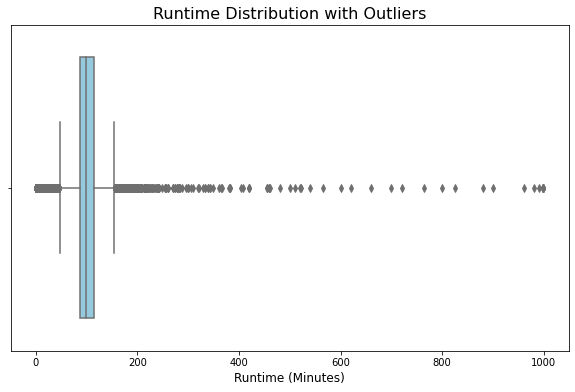

In [0]:
# Whiskers plot to visualize typical runtime and outliers
runtime_pd = df.select("runtime").toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(x=runtime_pd['runtime'], color='skyblue')

plt.title("Runtime Distribution with Outliers", fontsize=16)
plt.xlabel("Runtime (Minutes)", fontsize=12)

plt.show()

Without outliers:

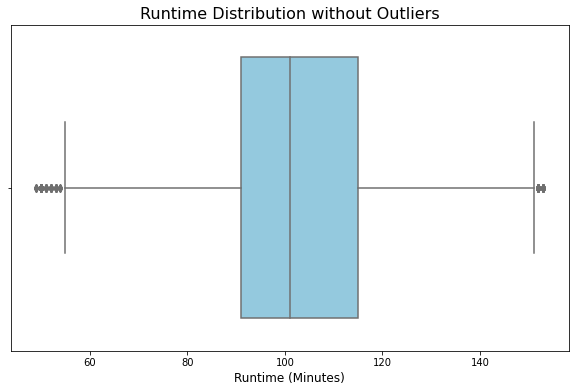

In [0]:
# Convert to pandas DataFrame
df_no_outliers_pd = df_no_outliers.select("runtime").toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(x=df_no_outliers_pd['runtime'], color='skyblue')

plt.title("Runtime Distribution without Outliers", fontsize=16)
plt.xlabel("Runtime (Minutes)", fontsize=12)

plt.show()

### POPULARITY

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for 'popularity' column
total = df.count()

nulls   = df.filter(col("popularity").isNull()).count()
empties = df.filter((col("popularity") == "") |(col("popularity") == " ")).count()
nones   = df.filter(col("popularity").isin("None", "none")).count()
zeros   = df.filter(col("popularity") == "0").count()

print(f"popularity: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

popularity: total=20655, nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=1232


Can **popularity** be zero? Let's display some examples of rows with **popularity** = 0:

In [0]:
# Count how many movies have popularity == 0
zero_pop_count = df.filter(col("popularity") == 0).count()
print(f"Number of movies with popularity = 0: {zero_pop_count}")

# Display some examples of movies with popularity == 0 
display(
    df
    .filter(col("popularity") == 0)
    .limit(10)
)

Number of movies with popularity = 0: 1232


id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,genres_array,release_date_norm,release_date
1224180,Go! Go! Cory Carson: The Chrissy On Nicktoons,10.0,1,Released,200,60,false,400,tt0136522,en,Go! Go! Cory Carson: The Chrissy On Nicktoons,Go! Go! Cory Carson: The Chrissy,0.0,English,"Family, Animation, TV Movie",null,null,null,null,"List(Family, Animation, TV Movie)",12/28/2023,2023-12-28
1224336,七声,null,0,Released,11972,null,false,0,tt0137555,zh,七声,null,0.0,null,null,null,null,List(Mandarin),null,null,null,null
1234721,Halo 2,null,0,Released,125000000,null,false,125000000,tt0357718,en,Halo 2,null,0.0,null,null,null,null,null,null,null,null,null
1278736,Thanaweyat texas,null,0,Released,5,null,true,7,tt03847583,ar,Thanaweyat texas,"""The Texas High School"" is one of the most famous crime and drama films, telling the story of a group of high school students in Texas who enter the world of drug trafficking. The film boldly and clearly addresses the challenges and risks faced by these young people and how those decisions affect their lives and future.",0.0,null,"Crime, Drama, Mystery, Action",List(Contagious Films),List(United States of America),null,null,"List(Crime, Drama, Mystery, Action)",4/2/2024,2024-04-02
1353861,Martin Four,null,0,Released,1000,null,false,10000,tt0406059,en,Martin Four,null,0.0,null,null,null,null,null,null,null,null,null
1220115,Altıpatlar Tekkale,null,0,Released,20000,null,false,7000,tt11851990,tr,Altıpatlar Tekkale,null,0.0,null,"Action, Drama, Crime",List(Nortarts),null,List(Turkish),null,"List(Action, Drama, Crime)",2/12/2010,2010-02-12
1202541,The Untold Tales Of Tūteremoana,null,0,Released,500,72,false,50000,tt14546202,en,The Untold Tales Of Tūteremoana,"The Untold Tales Of Tūteremoana is a coming-of-age Fantasy-Drama series born of the stars and rooted in the mountains, forests, rivers and sand dunes of Aotearoa (New Zealand). The writer and director Hiona Henare recreates three oral stories taken from her own tribal histories, in a reawakening of traditional Māori storytelling. Each story centres around a young lead protagonist who must rise to the challenge and defend their people, land and customary practices. The Untold Tales Of Tūteremoana is 100% Māori and celebrates the renaissance of Hiona’s endangered native language. It features an all Māori cast with veterans of stage and screen, along with a new generation of emerging young talent who shine, and are at the heart of each of the three stories.",0.0,"A coming-of-age Fantasy-Drama series born of the stars and rooted in the mountains, forests, rivers and sand dunes of Aotearoa (New Zealand).",null,null,null,null,null,null,null,null
1269737,Coca-Cola: The Fan Movie,null,0,Released,30000,20,false,20000,tt14740962,en,Coca-Cola: The Fan Movie,"In a alternate universe, Coca-Cola was banned by it's suspicious chemicals. A man named Eric is sent out by The United Nations to find the remaining remnants of Coca-Cola with the help of his childhood friend Austin.",0.0,Where Every Sip Tells a Story,"Adventure, Comedy, Drama",List(Rearick Film Studios),null,null,"List(adventure comedy, comedy, adventure)","List(Adventure, Comedy, Drama)",8/6/2021,2021-08-06
1085661,Hard to do Good,10.0,1,Released,5000,3,true,5000,tt15164248,en,Hard to do Good,The gangsters kidnapped and robbed a businessman all his money.,0.0,The gangsters kidnapped and robbed a businessman all his money. The very same day when the night comes the gangster leader couldn’t be able to sleep.,Adventure,List(Pk65 films),List(South Africa),List(Sotho),"List(sexual violence, criminal released on technicality, intergenerational substance abuse, violence)",List(Adventure),8/1/2021,2021-08-01
1299936,Do Mundo Não Se Leva Nada,null,0,Released,50,null,false,50,tt1645746,pt,Do Mundo Não Se Leva Nada,null,0.0,null,null,null,null,null,null

In [0]:
# Calculate summary statistics for popularity
stats = df.agg(
    F.min("popularity").alias("min_popularity"),
    F.expr("percentile_approx(popularity, 0.5)").alias("median_popularity"),
    F.avg("popularity").alias("average_popularity"),
    F.max("popularity").alias("max_popularity")
).collect()[0]

print(f"Min popularity     : {stats['min_popularity']}")
print(f"Median popularity  : {stats['median_popularity']}")
print(f"Average popularity : {stats['average_popularity']:.2f}")
print(f"Max popularity     : {stats['max_popularity']}")

Min popularity     : 0.0
Median popularity  : 6.303
Average popularity : 11.88
Max popularity     : 2994.357


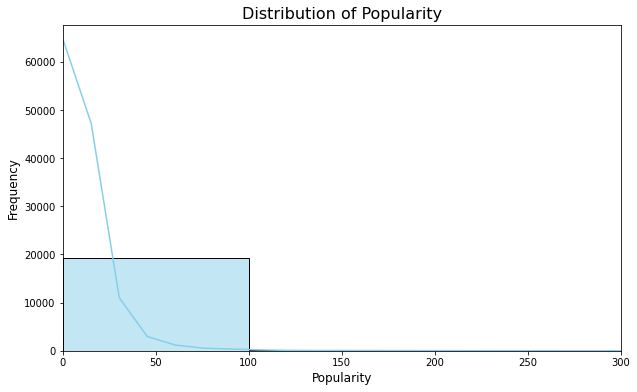

In [0]:
# Filter Spark DataFrame
pop_filtered = df.filter(df['popularity'] > 0)

# Convert to Pandas
pop_filtered_pd = pop_filtered.select('popularity').toPandas()

# Plot
plt.figure(figsize=(10, 6))
sns.histplot(pop_filtered_pd['popularity'], kde=True, color='skyblue', bins=30)

plt.xlim(0, 300)
plt.title("Distribution of Popularity", fontsize=16)
plt.xlabel("Popularity", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

plt.show()

## Categorical Feature Analysis

### TITLE

In [0]:
# Count null, empty, and "None"/"none" titles
null_count = df.filter(col("title").isNull()).count()
empty_count = df.filter((col("title") == "") | (col("title") == " ")).count()
none_count = df.filter((col("title") == "None") | (col("title") == "none")).count()

print(f"Null titles: {null_count}")
print(f"Empty titles: {empty_count}")
print(f"None titles: {none_count}")

Null titles: 0
Empty titles: 0
None titles: 0


In [0]:
# Title length distribution
title_len_df = df.withColumn("title_length", length(col("title")))
min_len = title_len_df.agg({"title_length": "min"}).collect()[0][0]
max_len = title_len_df.agg({"title_length": "max"}).collect()[0][0]
median_len = title_len_df.approxQuantile("title_length", [0.5], 0.01)[0]
print(f"Title length — min: {min_len}, median: {median_len:.0f}, max: {max_len}")

# Show extremes
print("Longest titles:")
display(
    title_len_df
    .orderBy(col("title_length").desc())
    .select("id", "title", "title_length")
    .limit(5)
)
print("Shortest non-empty titles:")
display(
    title_len_df
    .filter(col("title").isNotNull() & (col("title") != ""))
    .orderBy(col("title_length").asc())
    .select("id", "title", "title_length")
    .limit(5)
)


Title length — min: 1, median: 14, max: 213
Longest titles:


id,title,title_length
989531,"Titanic Tits: Rural Cosplayer (Age 19) With A Submissive Streak (Everybody Gets A Titty & Nipple Fuck & Cums On Her Tits) P-Cup With Enormous Nipples Ravished By 12 Continuous Loads In A Titty Fuck Four-Some Orgy,",213
1375813,"At an idyllic writers retreat in Morocco, a newly single novelist finds an unexpected connection with a younger man who's reevaluating his life choices.",152
1043335,"120% of the time, you'll encounter a pervert! The AV debut of Iori Yugi, a wife with extra large 128 cm P-cup tits that will amaze anyone!",138
1042427,"Wife with super big nipples and P-cup breasts who has been raped for a long time, training and Nakadashi sexual intercourse, Iori Yuuki",135
1393343,Las espantosas aventuras de una rubia tonta y un valenciano de pueblo que se convierte en dinosaurio en un museo paleontológico 2,129


Shortest non-empty titles:


id,title,title_length
1061979,春,1
1020263,I,1
15155,G,1
1371237,b,1
717807,G,1


**title** column does not have any missing values and has the right data type.

### STATUS

Let's check for distinct values 

In [0]:
# Count distinct non-null statuses
distinct_status_count = df.filter(col("status").isNotNull()).select("status").distinct().count()
print(f"Number of distinct 'status' values (excluding nulls): {distinct_status_count}")

# Show frequency of each status
status_counts = df.groupBy("status").count().orderBy(col("count").desc())
print("Counts per status:")
display(status_counts)


Number of distinct 'status' values (excluding nulls): 6
Counts per status:


status,count
Released,20517
In Production,91
Post Production,31
Planned,14
Canceled,1
Rumored,1


In [0]:
# Calculate average and median revenue by status
status_revenue_stats = (
    df
    .groupBy("status")
    .agg(
        F.avg("revenue").alias("average_revenue"),
        F.expr("percentile_approx(revenue, 0.5)").alias("median_revenue")
    )
    .orderBy("status")
)

# Display the results
display(status_revenue_stats)


status,average_revenue,median_revenue
Canceled,200.0,200
In Production,3.518205837362637E7,100
Planned,5270.214285714285,20
Post Production,9.887105564516129E7,196
Released,3.855725674738022E7,1894378
Rumored,162286.0,162286


**We need to decide whether to predict the revenue of movies with all statuses or just the ones released**

### ADULT

In [0]:
# Check distinct values in the "adult" column and count their occurrences
distinct_adult = df.groupBy("adult").count()

# Get the number of distinct values in the "adult" column
distinct_adult_count = distinct_adult.count()
print(f"Number of distinct values in 'adult': {distinct_adult_count}")

# Display the distinct values along with their counts
display(distinct_adult)

Number of distinct values in 'adult': 2


adult,count
true,221
false,20434


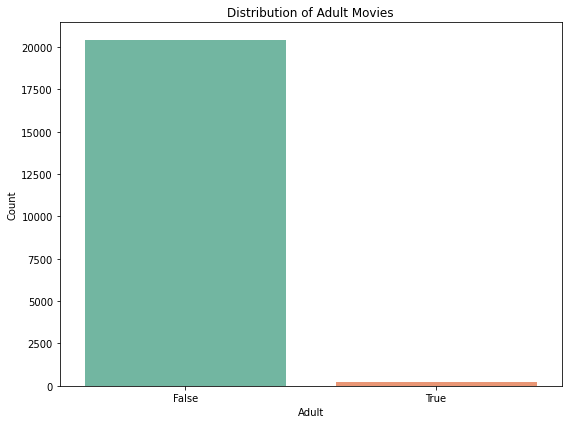

In [0]:
# Plot distribution of 'adult' values

# Count occurrences of each distinct value in 'adult' column
adult_distribution = df.groupBy("adult").count().toPandas()

# Plot the distribution
plt.figure(figsize=(8, 6))
sns.barplot(x='adult', y='count', data=adult_distribution, palette='Set2')
plt.title('Distribution of Adult Movies')
plt.xlabel('Adult')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

Overwhelming majority of the movies is **not** for adults only

### ORIGINAL_LANGUAGE and ORIGINAL_TITLE

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for original_language and original_title
for cname in ["original_language", "original_title"]:
    nulls   = df.filter(col(cname).isNull()).count()
    empties = df.filter((col(cname) == "") |(col(cname) == " ")).count()
    nones   = df.filter(col(cname).isin("None", "none")).count()
    zeros   = df.filter(col(cname) == "0").count()

    print(
        f"{cname}: nulls={nulls}, "
        f"empty strings={empties}, "
        f"'None'/'none' strings={nones}, "
        f"zero values={zeros}"
    )


original_language: nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=0
original_title: nulls=0, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Group by original_language and count occurrences
language_counts = df.groupBy("original_language").count()

# Sort and get the top 20 languages
top_20_languages = language_counts.orderBy(col("count").desc()).limit(20)

# Show the count of movies in the top 20 languages
top_20_languages.show()

+-----------------+-----+
|original_language|count|
+-----------------+-----+
|               en|13490|
|               es|  950|
|               fr|  730|
|               zh|  553|
|               ru|  490|
|               ja|  490|
|               hi|  439|
|               pt|  417|
|               it|  324|
|               de|  321|
|               tr|  292|
|               ko|  264|
|               cn|  181|
|               ar|  159|
|               ml|  153|
|               fa|  137|
|               ta|  130|
|               nl|   94|
|               sv|   86|
|               te|   80|
+-----------------+-----+



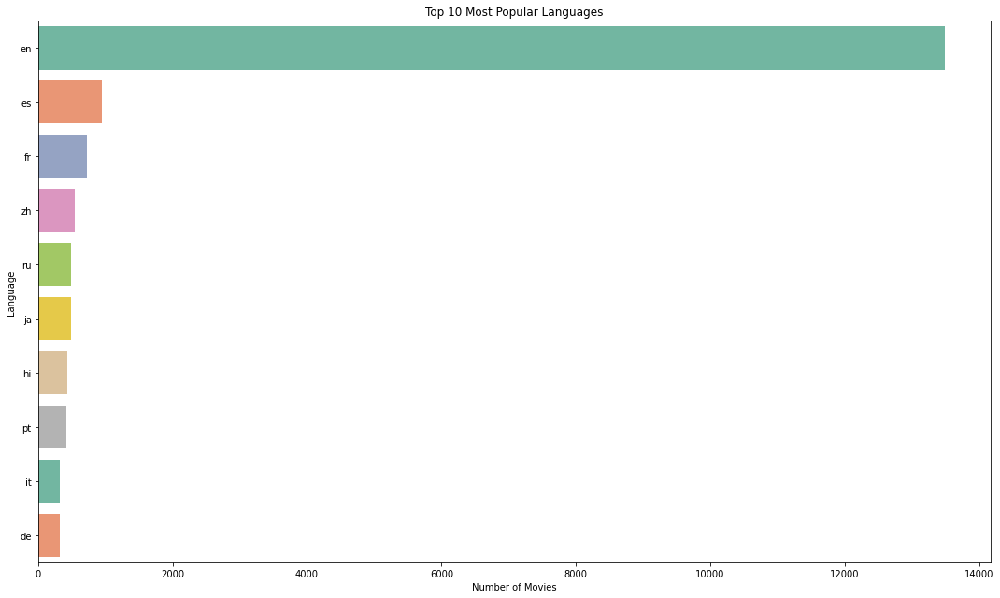

In [0]:
# Group by original_language and count occurrences
language_counts = df.groupBy("original_language").count().orderBy(col("count").desc())

# Show top 5 languages by count
top_languages = language_counts.limit(10).toPandas()

# Plot top 5 languages
plt.figure(figsize=(15, 9))
sns.barplot(x="count", y="original_language", data=top_languages, palette="Set2")
plt.title('Top 10 Most Popular Languages')
plt.xlabel('Number of Movies')
plt.ylabel('Language')
plt.tight_layout()
plt.show()

Great majority of the movies was filmed in english as the original language.

In [0]:
# Count the total number of rows
total_rows = df.count()

# Count the number of rows where the original_title is different from title
different_titles_count = df.filter(col("original_title") != col("title")).count()

# Calculate the percentage of rows where original_title is different from title
percentage_different_titles = (different_titles_count / total_rows) * 100

print(f"Total rows: {total_rows}")
print(f"Number of movies with different 'original_title' than 'title': {different_titles_count}")
print(f"Percentage of movies with different titles: {percentage_different_titles:.2f}%")

Total rows: 20655
Number of movies with different 'original_title' than 'title': 4798
Percentage of movies with different titles: 23.23%


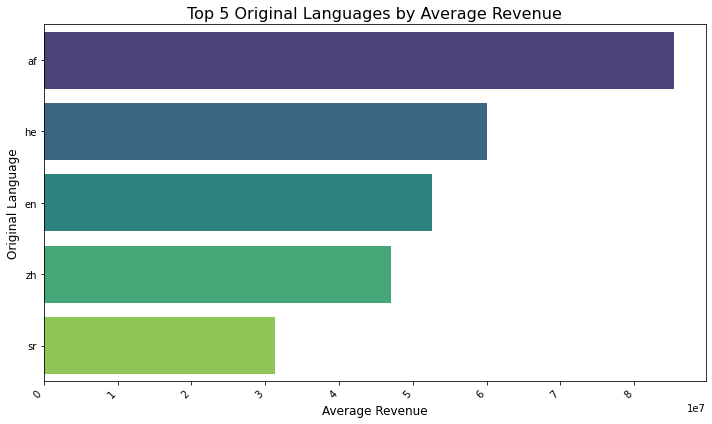

In [0]:
# Group by original_language and calculate the average revenue
language_revenue_avg = df.groupBy("original_language") \
    .agg(F.avg("revenue").alias("average_revenue"))

# Sort the languages by average revenue in descending order
language_revenue_avg = language_revenue_avg.orderBy(col("average_revenue").desc()).limit(5)

# Convert to Pandas for visualization
language_revenue_avg_pd = language_revenue_avg.toPandas()

# 4) Create a pretty bar plot
plt.figure(figsize=(10, 6))
sns.barplot(
    x="average_revenue", 
    y="original_language", 
    data=language_revenue_avg_pd, 
    palette="viridis"  # Color palette
)

# Add titles and labels for clarity
plt.title('Top 5 Original Languages by Average Revenue', fontsize=16)
plt.xlabel('Average Revenue', fontsize=12)
plt.ylabel('Original Language', fontsize=12)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

# Adjust layout for better spacing
plt.tight_layout()

# Show the plot
plt.show()


The listed short forms of languages refer to:
- **tn**: Tswana
- **zh**: Chinese
- **ko**: Korean
- **hi**: Hindi

https://www.science.co.il/language/Codes.php

### OVERVIEW

In [0]:
# Summary of null, empty-string, "None"/"none", and zero counts for 'overview' column
total = df.count()

nulls   = df.filter(col("overview").isNull()).count()
empties = df.filter((col("overview") == "") | (col("overview") == " ")).count()
nones   = df.filter(col("overview").isin("None", "none")).count()
zeros   = df.filter(col("overview") == "0").count()

print(f"overview: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

overview: total=20655, nulls=1674, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
# Set those empty or whitespace-only overviews to null
df = df.withColumn(
    "overview",
    when(trim(col("overview")) == "", None).otherwise(col("overview"))
)

# Then check again how many empty strings there are
empties = df.filter((col("overview") == "") |(col("overview") == " ")).count()
print(f"Number of empty strings left: {empties}")

Number of empty strings left: 0


In [0]:
# Add a column with the length of each overview
df_length = df.withColumn("overview_length", length(col("overview")))

# Compute min, max, avg, and median of overview_length
stats = (
    df_length
    .agg(
        F.min("overview_length").alias("min_length"),
        F.max("overview_length").alias("max_length"),
        F.avg("overview_length").alias("avg_length"),
        F.expr("percentile_approx(overview_length, 0.5)").alias("median_length")
    )
    .collect()[0]
)

min_length    = stats["min_length"]
max_length    = stats["max_length"]
avg_length    = stats["avg_length"]
median_length = stats["median_length"]

print(f"Shortest overview length: {min_length}")
print(f"Longest overview length : {max_length}")
print(f"Average overview length : {avg_length:.1f}")
print(f"Median overview length  : {median_length}")

# Show examples of the shortest and longest overviews
print("Examples of shortest overviews:")
display(
    df_length
      .filter(col("overview_length") == min_length)
      .select("id", "title", "overview", "overview_length")
      .limit(5)
)

print("Examples of longest overviews:")
display(
    df_length
      .filter(col("overview_length") == max_length)
      .select("id", "title", "overview", "overview_length")
      .limit(5)
)


Shortest overview length: 1
Longest overview length : 998
Average overview length : 274.5
Median overview length  : 235
Examples of shortest overviews:


id,title,overview,overview_length
1371237,b,x,1


Examples of longest overviews:


id,title,overview,overview_length
476292,Maquia: When the Promised Flower Blooms,"Maquia is a member of a special race called the Iorph who can live for hundreds of years. However, Maquia has always felt lonely despite being surrounded by her people, as she was orphaned from a young age. She daydreams about the outside world, but dares not travel from her home due to the warnings of the clan's chief. One day the kingdom of Mezarte invades her homeland. They already have what is left of the giant dragons, the Renato, under their control, and now their king wishes to add the immortality to his bloodline. They ravage the Iorph homeland and kill most of its inhabitants. Caught in the midst of the attack, Maquia is carried off by one of the Renato. It soon dies, and she is left deserted in a forest, now truly alone save for the cries of a single baby off in the distance. Maquia finds the baby in a destroyed village and decides to raise him as her own, naming him Ariel. Although she knows nothing of the human world, how to raise a child that ages much faster than her.",998


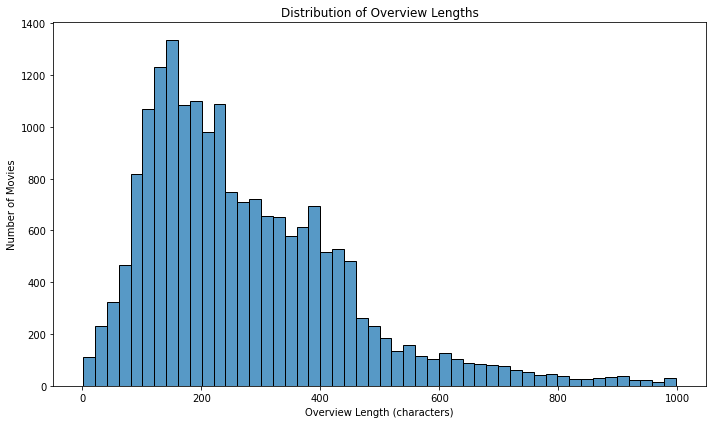

In [0]:
# Plot the distribution of overview lengths
overview_lengths_pd = df_length.select("overview_length").toPandas()

plt.figure(figsize=(10, 6))
sns.histplot(overview_lengths_pd["overview_length"], bins=50, kde=False)
plt.title("Distribution of Overview Lengths")
plt.xlabel("Overview Length (characters)")
plt.ylabel("Number of Movies")
plt.tight_layout()
plt.show()

Distribution of overview leghts is right skewed. It indicates that most overviews have around 150 words. Only some have the maximum number of 1000 characters.

In [0]:
df = df.drop("overview_length")

### TAGLINE

The column **tagline** has the correct data type - string. Let's investigate this feature:

In [0]:
# Summary for 'tagline'
total = df.count()

nulls   = df.filter(col("tagline").isNull()).count()
empties = df.filter((col("tagline") == "") | (col("tagline") == " ")).count()
nones   = df.filter(col("tagline").isin("None", "none")).count()
zeros   = df.filter(col("tagline") == "0").count()

print(f"tagline: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

tagline: total=20655, nulls=7304, empty strings=0, 'None'/'none' strings=1, zero values=0


In [0]:
# Replace "None"/"none" in `tagline` with null
from pyspark.sql.functions import when, col

# Count before replacement
none_count = df.filter(col("tagline").isin("None", "none")).count()
print(f"Taglines with 'None' or 'none' before cleanup: {none_count}")

# Perform replacement
df = df.withColumn(
    "tagline",
    when(col("tagline").isin("None", "none"), None).otherwise(col("tagline"))
)

# Verify post-replacement
post_none_count = df.filter(col("tagline").isNull()).count()
print(f"Taglines null after cleanup: {post_none_count}")

Taglines with 'None' or 'none' before cleanup: 1
Taglines null after cleanup: 7305


In [0]:
# Compute min, max, average, and median lengths of `tagline`
from pyspark.sql.functions import length, avg, expr, min as spark_min, max as spark_max

df_length = df.withColumn("tagline_length", length(col("tagline")))

stats = df_length.agg(
    spark_min("tagline_length").alias("min_length"),
    spark_max("tagline_length").alias("max_length"),
    avg("tagline_length").alias("avg_length"),
    expr("percentile_approx(tagline_length, 0.5)").alias("median_length")
).collect()[0]

print(f"Shortest tagline: {stats['min_length']}")
print(f"Longest  tagline: {stats['max_length']}")
print(f"Average  tagline: {stats['avg_length']:.1f}")
print(f"Median   tagline: {stats['median_length']}")

Shortest tagline: 1
Longest  tagline: 248
Average  tagline: 41.9
Median   tagline: 35


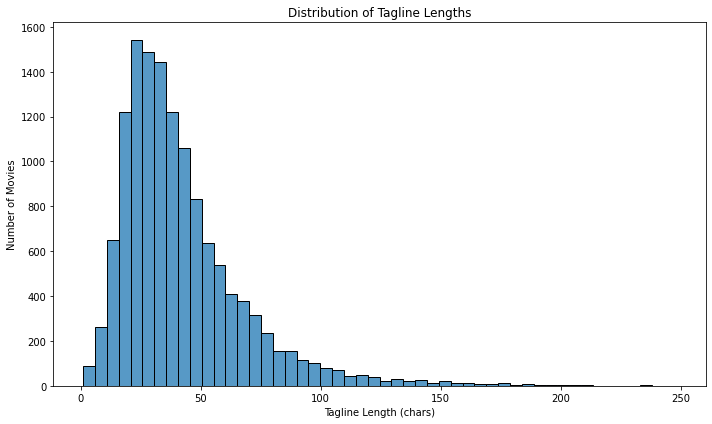

In [0]:
# Plot distribution of tagline lengths
# Convert to Pandas
lengths_pd = df_length.select("tagline_length").toPandas()["tagline_length"].dropna()

plt.figure(figsize=(10, 6))
sns.histplot(lengths_pd, bins=50, kde=False)
plt.title("Distribution of Tagline Lengths")
plt.xlabel("Tagline Length (chars)")
plt.ylabel("Number of Movies")
plt.tight_layout()
plt.show()


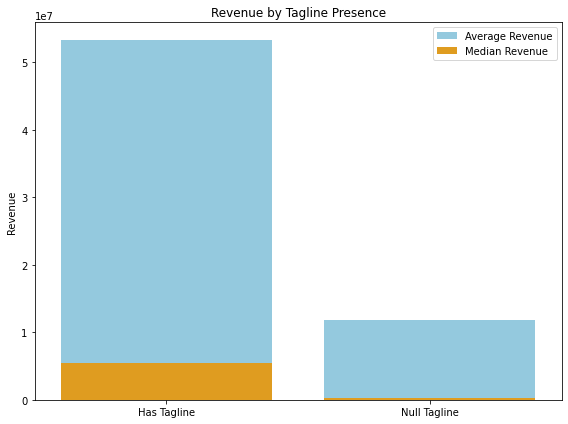

In [0]:
# Compare average revenue: tagline NULL vs non-NULL
# Compute stats
rev_stats = (
    df.groupBy(col("tagline").isNull().alias("tagline_null"))
      .agg(
          F.avg("revenue").alias("avg_revenue"),
          F.expr("percentile_approx(revenue, 0.5)").alias("median_revenue")
      )
      .orderBy("tagline_null")
      .toPandas()
)

# Map boolean to labels
rev_stats["tagline_null"] = rev_stats["tagline_null"].map({True: "Null Tagline", False: "Has Tagline"})

plt.figure(figsize=(8, 6))
sns.barplot(x="tagline_null", y="avg_revenue", data=rev_stats, color="skyblue", label="Average Revenue", ci=None)
sns.barplot(x="tagline_null", y="median_revenue", data=rev_stats, color="orange", label="Median Revenue", ci=None)
plt.title("Revenue by Tagline Presence")
plt.xlabel("")
plt.ylabel("Revenue")
plt.legend()
plt.tight_layout()
plt.show()

### GENRES

In [0]:
# Summary for 'genres'
total = df.count()

nulls   = df.filter(col("genres").isNull()).count()
empties = df.filter((col("genres") == "") | (col("genres") == " ")).count()
nones   = df.filter(col("genres").isin("None", "none")).count()
zeros   = df.filter(col("genres") == "0").count()

print(f"genres: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

genres: total=20655, nulls=1936, empty strings=0, 'None'/'none' strings=0, zero values=0


In [0]:
df.select("genres", "genres_array").show(50, truncate=False)

+-----------------------------------------+-------------------------------------------+
|genres                                   |genres_array                               |
+-----------------------------------------+-------------------------------------------+
|Adventure, Drama, Action, Science Fiction|[Adventure, Drama, Action, Science Fiction]|
|Drama                                    |[Drama]                                    |
|Comedy, Drama                            |[Comedy, Drama]                            |
|Drama, Comedy                            |[Drama, Comedy]                            |
|Drama                                    |[Drama]                                    |
|Romance                                  |[Romance]                                  |
|Adventure                                |[Adventure]                                |
|Comedy, Documentary, Animation           |[Comedy, Documentary, Animation]           |
|Comedy, Romance, Thriller      

In [0]:
# Count occurrences of each distinct genre
genre_counts = (
    df
    .select(explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .count()
    .orderBy(col("count").desc())
)

display(genre_counts)

genre,count
Drama,8700
Comedy,6400
Action,3764
Thriller,3711
Romance,3180
Adventure,2397
Crime,2310
Horror,2104
Family,1610
Fantasy,1451


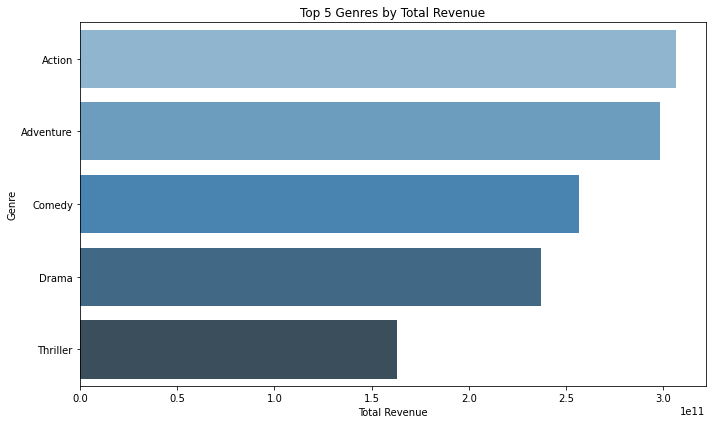

In [0]:
# Plot top 5 genres by total revenue

top5_revenue = (
    df
    .select(col("revenue"), explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .agg(spark_sum("revenue").alias("total_revenue"))
    .orderBy(col("total_revenue").desc())
    .limit(5)
    .toPandas()
)

import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(
    x="total_revenue",
    y="genre",
    data=top5_revenue,
    palette="Blues_d"
)
plt.title("Top 5 Genres by Total Revenue")
plt.xlabel("Total Revenue")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()

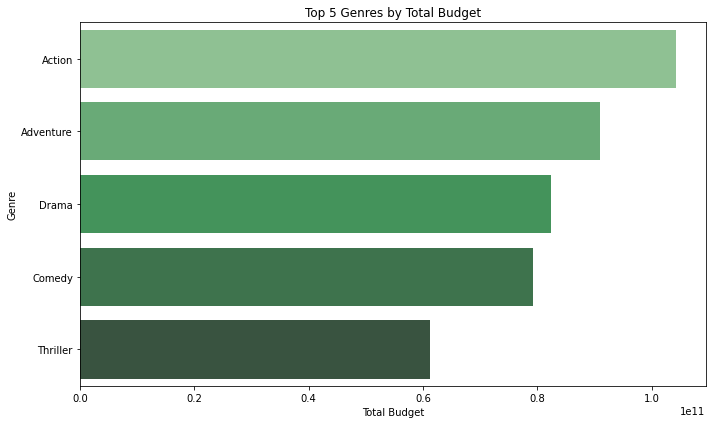

In [0]:
# Plot top 5 genres by total budget
top5_budget = (
    df
    .select(col("budget"), explode(col("genres_array")).alias("genre"))
    .groupBy("genre")
    .agg(spark_sum("budget").alias("total_budget"))
    .orderBy(col("total_budget").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(10, 6))
sns.barplot(
    x="total_budget",
    y="genre",
    data=top5_budget,
    palette="Greens_d"
)
plt.title("Top 5 Genres by Total Budget")
plt.xlabel("Total Budget")
plt.ylabel("Genre")
plt.tight_layout()
plt.show()


In [0]:
# Overwrite "genres" with the array column
df = df.withColumn("genres", col("genres_array"))

# Drop the helper "genres_array" column
df = df.drop("genres_array")

# Verify the change
df.select("genres").printSchema()


root
 |-- genres: array (nullable = true)
 |    |-- element: string (containsNull = false)



### PRODUCTION_COMPANIES

In [0]:
# Summary for 'production_companies'
total = df.count()

nulls   = df.filter(col("production_companies").isNull()).count()
empties = df.filter((col("production_companies") == "") | (col("production_companies") == " ")).count()
nones   = df.filter(col("production_companies").isin("None", "none")).count()
zeros   = df.filter(col("production_companies") == "0").count()

print(f"production_companies: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-2616139527849536>:5
      2 total = df.count()
      4 nulls   = df.filter(col("production_companies").isNull()).count()
----> 5 empties = df.filter((col("production_companies") == "") | (col("production_companies") == " ")).count()
      6 nones   = df.filter(col("production_companies").isin("None", "none")).count()
      7 zeros   = df.filter(col("production_companies") == "0").count()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /databricks/spark/python/pyspark/sql/dataframe.py:3125, in DataF

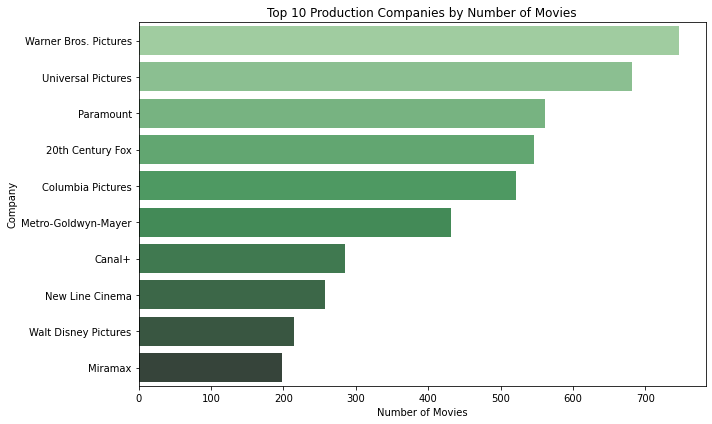

In [0]:
# Top 10 production_companies by number of movies
company_counts = (
    df
    .select(explode(col("production_companies")).alias("company"))
    .groupBy("company")
    .count()
    .orderBy(col("count").desc())
    .limit(10)
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="count", y="company", data=company_counts, palette="Greens_d")
plt.title("Top 10 Production Companies by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Company")
plt.tight_layout()
plt.show()


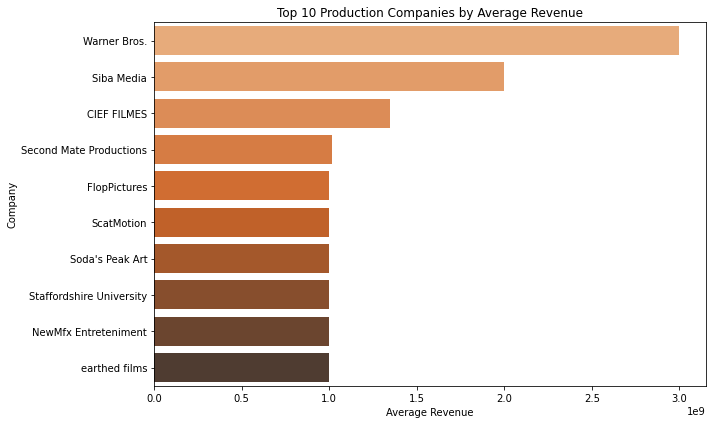

In [0]:
# 3) Top 10 production_companies by average revenue

company_revenue = (
    df
    .select(col("revenue"), explode(col("production_companies")).alias("company"))
    .groupBy("company")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .limit(10)
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="avg_revenue", y="company", data=company_revenue, palette="Oranges_d")
plt.title("Top 10 Production Companies by Average Revenue")
plt.xlabel("Average Revenue")
plt.ylabel("Company")
plt.tight_layout()
plt.show()


### PRODUCTION_COUNTRIES

In [0]:
# Summary for 'production_countries'
total = df.count()

nulls   = df.filter(col("production_countries").isNull()).count()
empties = df.filter((col("production_countries") == "") | (col("production_countries") == " ")).count()
nones   = df.filter(col("production_countries").isin("None", "none")).count()
zeros   = df.filter(col("production_countries") == "0").count()

print(f"production_countries: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-2616139527849542>:5
      2 total = df.count()
      4 nulls   = df.filter(col("production_countries").isNull()).count()
----> 5 empties = df.filter((col("production_countries") == "") | (col("production_countries") == " ")).count()
      6 nones   = df.filter(col("production_countries").isin("None", "none")).count()
      7 zeros   = df.filter(col("production_countries") == "0").count()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /databricks/spark/python/pyspark/sql/dataframe.py:3125, in DataF

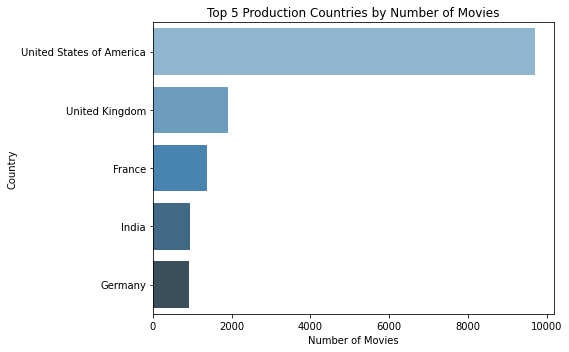

In [0]:
# Top 5 production_countries by number of movies

country_counts = (
    df
    .select(explode(col("production_countries")).alias("country"))
    .groupBy("country")
    .count()
    .orderBy(col("count").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="count", y="country", data=country_counts, palette="Blues_d")
plt.title("Top 5 Production Countries by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Country")
plt.tight_layout()
plt.show()

### SPOKEN_LANGUAGES

In [0]:
# Summary for 'spoken_languages'
total = df.count()

nulls   = df.filter(col("spoken_languages").isNull()).count()
empties = df.filter((col("spoken_languages") == "") | (col("spoken_languages") == " ")).count()
nones   = df.filter(col("spoken_languages").isin("None", "none")).count()
zeros   = df.filter(col("spoken_languages") == "0").count()

print(f"spoken_languages: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-2616139527849547>:5
      2 total = df.count()
      4 nulls   = df.filter(col("spoken_languages").isNull()).count()
----> 5 empties = df.filter((col("spoken_languages") == "") | (col("spoken_languages") == " ")).count()
      6 nones   = df.filter(col("spoken_languages").isin("None", "none")).count()
      7 zeros   = df.filter(col("spoken_languages") == "0").count()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /databricks/spark/python/pyspark/sql/dataframe.py:3125, in DataFrame.filter(self, co

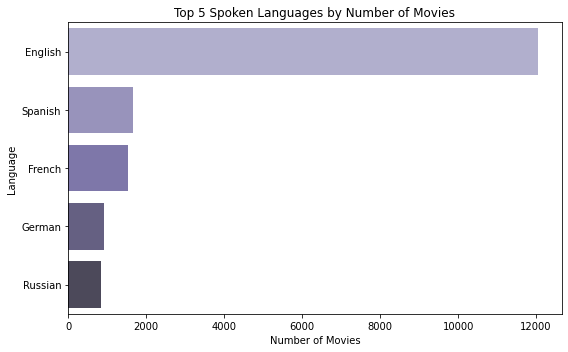

In [0]:
# Top 5 spoken_languages by number of movies
lang_counts = (
    df
    .select(explode(col("spoken_languages")).alias("language"))
    .groupBy("language")
    .count()
    .orderBy(col("count").desc())
    .limit(5)
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="count", y="language", data=lang_counts, palette="Purples_d")
plt.title("Top 5 Spoken Languages by Number of Movies")
plt.xlabel("Number of Movies")
plt.ylabel("Language")
plt.tight_layout()
plt.show()

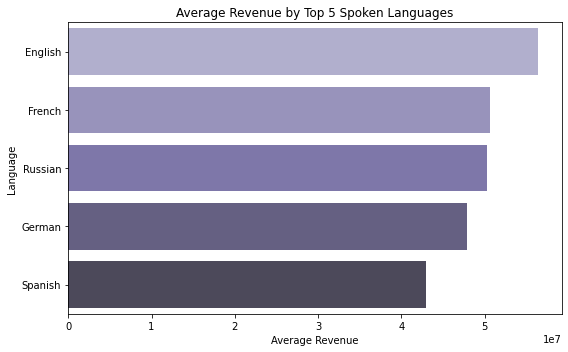

In [0]:
# Average revenue per top 5 spoken_languages
top5_langs = lang_counts["language"].tolist()
avg_rev_lang = (
    df
    .select(col("revenue"), explode(col("spoken_languages")).alias("language"))
    .filter(col("language").isin(top5_langs))
    .groupBy("language")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .toPandas()
)

plt.figure(figsize=(8,5))
sns.barplot(x="avg_revenue", y="language", data=avg_rev_lang, palette="Purples_d")
plt.title("Average Revenue by Top 5 Spoken Languages")
plt.xlabel("Average Revenue")
plt.ylabel("Language")
plt.tight_layout()
plt.show()

### KEYWORDS

In [0]:
# Summary for 'keywords'
total = df.count()

nulls   = df.filter(col("keywords").isNull()).count()
empties = df.filter((col("keywords") == "") | (col("keywords") == " ")).count()
nones   = df.filter(col("keywords").isin("None", "none")).count()
zeros   = df.filter(col("keywords") == "0").count()

print(f"keywords: total={total}, nulls={nulls}, empty strings={empties}, 'None'/'none' strings={nones}, zero values={zeros}")

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
File <command-2616139527849553>:5
      2 total = df.count()
      4 nulls   = df.filter(col("keywords").isNull()).count()
----> 5 empties = df.filter((col("keywords") == "") | (col("keywords") == " ")).count()
      6 nones   = df.filter(col("keywords").isin("None", "none")).count()
      7 zeros   = df.filter(col("keywords") == "0").count()

File /databricks/spark/python/pyspark/instrumentation_utils.py:48, in _wrap_function.<locals>.wrapper(*args, **kwargs)
     46 start = time.perf_counter()
     47 try:
---> 48     res = func(*args, **kwargs)
     49     logger.log_success(
     50         module_name, class_name, function_name, time.perf_counter() - start, signature
     51     )
     52     return res

File /databricks/spark/python/pyspark/sql/dataframe.py:3125, in DataFrame.filter(self, condition)
   3123     jdf = self._jdf.fil

In [0]:
# Top 50 keywords by frequency

keyword_counts = (
    df
    .select(explode(col("keywords")).alias("keyword"))
    .groupBy("keyword")
    .count()
    .orderBy(col("count").desc())
    .limit(50)
    .toPandas()
)

print("Top 50 Keywords by Frequency:")
display(keyword_counts)


Top 50 Keywords by Frequency:


keyword,count
based on novel or book,1199
woman director,904
murder,719
new york city,634
california,501
based on true story,470
duringcreditsstinger,466
revenge,462
sequel,452
biography,411


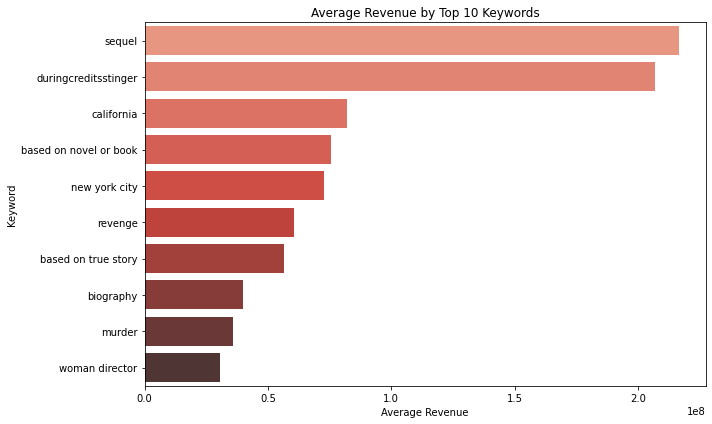

In [0]:
# Average revenue per top 10 keywords
top10_keywords = keyword_counts["keyword"].tolist()[:10]
avg_rev_kw = (
    df
    .select(col("revenue"), explode(col("keywords")).alias("keyword"))
    .filter(col("keyword").isin(top10_keywords))
    .groupBy("keyword")
    .agg(avg("revenue").alias("avg_revenue"))
    .orderBy(col("avg_revenue").desc())
    .toPandas()
)

plt.figure(figsize=(10,6))
sns.barplot(x="avg_revenue", y="keyword", data=avg_rev_kw, palette="Reds_d")
plt.title("Average Revenue by Top 10 Keywords")
plt.xlabel("Average Revenue")
plt.ylabel("Keyword")
plt.tight_layout()
plt.show()


####Create Profit and ROI to enhance our analysis

In [0]:
# Filter out rows with zero or null budget or revenue to avoid division errors
df_money = df.filter((col("budget") > 0) & (col("revenue") > 0))

# Create 'profit' and 'roi' columns
df_money = df_money.withColumn("profit", col("revenue") - col("budget"))
df_money = df_money.withColumn("roi", col("revenue") / col("budget"))

In [0]:
# Describe the statistics for 'profit' and 'roi' columns in PySpark
df_money.describe(['profit', 'roi']).show()


+-------+--------------------+--------------------+
|summary|              profit|                 roi|
+-------+--------------------+--------------------+
|  count|               14150|               14150|
|   mean| 3.468157256805654E7|   361484.8693636515|
| stddev|1.3553096905208966E8|1.5589771340231799E7|
|    min|          -899999984|4.444444444444444E-9|
|    max|          4999999899|               1.0E9|
+-------+--------------------+--------------------+



####Check only de ROI > 0

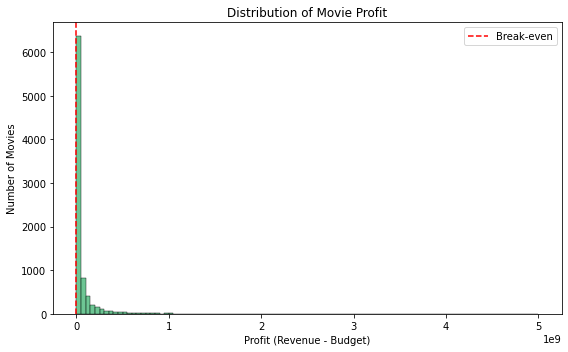

In [0]:
# Step 1: Calculate profit and ROI
df_money = df.withColumn("profit", col("revenue") - col("budget"))
df_money = df_money.withColumn("roi", col("revenue") / col("budget"))

# Step 2: Filter for positive profit and ROI
profit_roi_filtered = df_money.filter((col('profit') > 0) & (col('roi') > 0))

# Step 3: Convert to pandas DataFrame for plotting
profit_roi_filtered_pd = profit_roi_filtered.select('profit').toPandas()

# Step 4: Plot the distribution of profit
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 5))
sns.histplot(profit_roi_filtered_pd['profit'], bins=100, color='mediumseagreen')
plt.title('Distribution of Movie Profit')
plt.xlabel('Profit (Revenue - Budget)')
plt.ylabel('Number of Movies')
plt.axvline(0, color='red', linestyle='--', label='Break-even')
plt.legend()
plt.tight_layout()
plt.show()

#### Movies with the highest profit

In [0]:
# Step 1: Sort by profit in descending order and get the top 10 movies
top_profit = profit_roi_filtered.orderBy(col('profit'), ascending=False).limit(10)

# Step 2: Select the relevant columns (title, revenue, budget, profit)
top_profit_selected = top_profit.select('title', 'revenue', 'budget', 'profit')

# Step 3: Convert to pandas DataFrame to display in a table
top_profit_selected_pd = top_profit_selected.toPandas()

# Step 4: Display the result
print(top_profit_selected_pd)

                          title     revenue     budget      profit
0             babben: the movie  4999999999        100  4999999899
1                     Bee Movie  2930000000  150000000  2780000000
2             TikTok Rizz Party  3000000000  250000000  2750000000
3                        Avatar  2923706026  237000000  2686706026
4             Avengers: Endgame  2800000000  356000000  2444000000
5       Adventures in Bora Bora  3000000000  800000000  2200000000
6                       Titanic  2264162353  200000000  2064162353
7                   Best Of Joy  2000000000       1000  1999999000
8      Avatar: The Way of Water  2320250281  460000000  1860250281
9  Star Wars: The Force Awakens  2068223624  245000000  1823223624


#### Movies with the highest ROI

In [0]:
# Step 1: Sort by ROI in descending order and get the top 10 movies
top_roi = profit_roi_filtered.orderBy(col('roi'), ascending=False).limit(10)

# Step 2: Select the relevant columns (title, budget, revenue, roi)
top_roi_selected = top_roi.select('title', 'budget', 'revenue', 'roi')

# Step 3: Convert to pandas DataFrame to display in a table
top_roi_selected_pd = top_roi_selected.toPandas()

# Step 4: Display the result
print(top_roi_selected_pd)


                              title  budget     revenue           roi
0  GEESE - THE MONEY TALKS TOUR '24       1  1000000000  1.000000e+09
1             Pouring Out The Heart       1  1000000000  1.000000e+09
2                ירידתם של המגניבים       1  1000000000  1.000000e+09
3                     Lil Detective       2   999999999  5.000000e+08
4                   חברים על סמים 2       5  1000000000  2.000000e+08
5                              דילן       5  1000000000  2.000000e+08
6                   חברים על סמים 1       5  1000000000  2.000000e+08
7                Żyraf: Czas Zemsty       1   100004215  1.000042e+08
8                  A Cama do Macaco      10  1000000000  1.000000e+08
9           The Read N Review Movie       2   200000000  1.000000e+08


##Correlation Matrix for Popularity, Vote_Count and Revenue

In [0]:
# Convert to pandas for correlation analysis
df_pd = df.select('popularity', 'vote_count', 'revenue').toPandas()

# Compute correlation matrix
correlation_popularity = df_pd.corr()

# Display the correlation matrix
print("Correlation between Popularity, Vote Count, and Revenue:")
print(correlation_popularity)


Correlation between Popularity, Vote Count, and Revenue:
            popularity  vote_count   revenue
popularity    1.000000    0.233303  0.216446
vote_count    0.233303    1.000000  0.642672
revenue       0.216446    0.642672  1.000000


Vote count appears to have the strongest relationship with revenue.

Both popularity and vote count are positively correlated with revenue, but the relationship with popularity is weaker compared to the relationship between vote count and revenue.

# Export the dataset

In [0]:
from pyspark.sql.functions import concat_ws
# Convert all array<string> columns back into comma-separated strings
df_export = df \
  .withColumn("genres",               concat_ws(", ", col("genres"))) \
  .withColumn("production_companies", concat_ws(", ", col("production_companies"))) \
  .withColumn("production_countries", concat_ws(", ", col("production_countries"))) \
  .withColumn("spoken_languages",     concat_ws(", ", col("spoken_languages"))) \
  .withColumn("keywords",             concat_ws(", ", col("keywords")))

# Verify that genres is now a StringType
df_export.select("genres").printSchema()

root
 |-- genres: string (nullable = false)



In [0]:
# coalesce to 1 file (optional), write with header
df_export.coalesce(1) \
  .write \
  .mode("overwrite") \
  .option("header", "true") \
  .csv("/FileStore/tables/IMDB_Cleaned")

In [0]:
display(df)

id,title,vote_average,vote_count,status,revenue,runtime,adult,budget,imdb_id,original_language,original_title,overview,popularity,tagline,genres,production_companies,production_countries,spoken_languages,keywords,release_date_norm,release_date
30266,"20,000 Leagues Under the Sea",6.3,48,Released,8000000,85,false,200000,tt0006333,en,"20,000 Leagues Under the Sea","Captain Nemo has built a fantastic submarine for his mission of revenge. He has traveled over 20,000 leagues in search of Charles Denver - a man who caused the death of Princess Daaker. Seeing what he had done, Denver took the daughter to his yacht and sailed away.",3.474,The First Submarine Photoplay Ever Filmed,"List(Adventure, Drama, Action, Science Fiction)",List(The Universal Film Mfg. Co.),"List(Bahamas, United States of America)",List(English),"List(revenge, captain nemo)",12/24/1916,1916-12-24
563515,Maria Rosa,null,0,Released,102768,50,false,18575,tt0007038,en,Maria Rosa,"Ramon loves Catalonian peasant Maria Rosa. He uses a knife belonging to her love Andreas to kill fisherman Pedro, so Andreas goes to jail for ten years. Maria will wait for him, but Ramon convinces her Andreas dies in prison so she agrees to marry him. On their wedding day Ramon is paroled. Maria then stabs Ramon.",0.64,null,List(Drama),List(Jesse L. Lasky Feature Play Company),List(United States of America),List(No Language),null,5/7/1916,1916-05-07
54242,Mickey,6.438,16,Released,8000000,71,false,250000,tt0009369,en,Mickey,"Mickey, an orphan who has been brought up in a mining settlement, is sent to New York to live with her aunt.",1.951,"She's all girl, but not used to Society Manners. She's a Hoyden, but her heart's pure gold. She'll exhilarate you, win you. The critic says this is the greatest comedy drama of the year.","List(Comedy, Drama)",List(Mabel Normand Feature Film Company),List(United States of America),List(English),"List(new york city, horse race, fish out of water, orphan, silent film)",8/1/1918,1918-08-01
70801,Daddy-Long-Legs,6.1,15,Released,4900000,85,false,0,tt0010040,en,Daddy-Long-Legs,"Wealthy Jarvis Pendleton acts as benefactor for orphan Judy Abbott, anonymously sponsoring her in her boarding school. But as she grows up, he finds himself falling in love with her, and she with him, though she does not know that the man she has fallen for is her benefactor.",2.044,null,"List(Drama, Comedy)",List(Mary Pickford Company),List(United States of America),List(No Language),"List(boarding school, orphan, silent film)",5/11/1919,1919-05-11
278093,The Miracle Man,3.0,1,Released,3600000,80,false,120000,tt0010466,en,The Miracle Man,"A gang of crooks evade the police by moving their operations to a small town. There the gang's leader encounters a faith healer and uses him to scam gullible public of funds for a supposed chapel. But when a real healing takes place, a change comes over the gang. Lost film, only the most famous scene has survived.",1.199,The photoplay that reaches the soul,List(Drama),"List(Paramount, Mayflower Photoplay Company)",List(United States of America),List(No Language),"List(con artist, silent film, lost film, partially lost film)",8/26/1919,1919-08-26
707496,Fool's Paradise,5.5,2,Released,901937,109,false,291367,tt0012181,en,Fool's Paradise,"In a Mexican border town Arthur befriends cantina girl Poll. She falls for him but he still loves the dancer Rosa. When the cigar Poll gives him explodes and blinds him, Arthur is duped into thinking Poll is Rosa and marries her. When his vision is surgically restored, he leaves for Siam to find Rosa.",0.996,null,List(Romance),List(Famous Players-Lasky Corporation),List(United States of America),List(No Language),null,12/9/1921,1921-12-09
889971,A Dangerous Adventure,null,0,Released,142000,null,false,175000,tt0013046,en,A Dangerous Adventure,"Grace Darmond, who had made quite a splash in the 1921 (and still extant) serial The Hope Diamond Mystery, returned to the Saturday matinees as Marjorie Stanton, the treasure-hunting

# To Read pls :)
We need to analyze the data more carefully because, upon checking the DataFrame again, I realized there are still many null values present. We should either remove these nulls in their respective sections or impute them, as otherwise, we would go from around **20,000 entries down to only 9,000**, and I’m not sure if that is too few.

Suggestions for handling null values and feature relevance:

- **`vote_average`**: fill nulls with the mean value.
- **`release_date`**: remove rows with null values.
- **`imdb_id`**: irrelevant for modeling, can be ignored.
- **`overview`**: irrelevant for modeling.
- **`tagline`**: irrelevant since it is not quantifiable (not a text mining project).
- **`genres`**: possibly remove, as handling it properly is unclear.
- **`production_countries` and `production_companies`**: could be used in the model if we categorize movies by studios/genres (e.g., Pixar, Disney, others/unknown). Open to suggestions.
- **`spoken_languages`**: seems important and could be handled similarly to `production_companies`.
- **`keywords` and `genres_array`**: potentially important, but unsure to what extent they can be effectively used.

Proposed features to use for modeling:

- `vote_average`
- `vote_count`
- `status`
- `release_date`
- `runtime`
- `adult`
- `budget`
- `original_language`
- `popularity`
- `genres`

We should only use **`production_countries`**, **`production_companies`**, and **`spoken_languages`** if feasible.

In [0]:
from pyspark.sql.functions import col, count, when

null_counts = {}

for c in df.columns:
    count_null = df.select(count(when(col(c).isNull(), True)).alias('null')).collect()[0]['null']
    null_counts[c] = count_null

# Mostrar resultado
for col_name, nulos in null_counts.items():
    print(f"Coluna '{col_name}' tem {nulos} valores nulos")

Coluna 'id' tem 0 valores nulos
Coluna 'title' tem 0 valores nulos
Coluna 'vote_average' tem 3885 valores nulos
Coluna 'vote_count' tem 0 valores nulos
Coluna 'status' tem 0 valores nulos
Coluna 'release_date' tem 1972 valores nulos
Coluna 'revenue' tem 0 valores nulos
Coluna 'runtime' tem 0 valores nulos
Coluna 'adult' tem 0 valores nulos
Coluna 'budget' tem 0 valores nulos
Coluna 'imdb_id' tem 3746 valores nulos
Coluna 'original_language' tem 0 valores nulos
Coluna 'original_title' tem 0 valores nulos
Coluna 'overview' tem 1674 valores nulos
Coluna 'popularity' tem 0 valores nulos
Coluna 'tagline' tem 7304 valores nulos
Coluna 'genres' tem 1936 valores nulos
Coluna 'production_companies' tem 3721 valores nulos
Coluna 'production_countries' tem 3282 valores nulos
Coluna 'spoken_languages' tem 2672 valores nulos
Coluna 'keywords' tem 5644 valores nulos
Coluna 'genres_array' tem 1936 valores nulos


In [0]:
df_model = df.na.drop()


In [0]:
df_model.count()

Out[10]: 9912

In [0]:
df.count()

Out[5]: 20655

we need to decide witch model we should use

the imports are here only because is not a defenitive code

In [0]:
from pyspark.ml.stat import Correlation
from pyspark.ml.feature import VectorAssembler
import pandas as pd

# List of numerical columns including the target 'revenue'
numeric_cols = ["vote_average", "vote_count", "runtime", "adult", "budget", "popularity", "revenue"]

# Assemble the numerical columns into a single feature vector
assembler = VectorAssembler(inputCols=numeric_cols, outputCol="numeric_features")
df_vector = assembler.transform(df_model).select("numeric_features")

# Calculate the Pearson correlation matrix
matrix = Correlation.corr(df_vector, "numeric_features", "pearson").head()[0]

# Convert the matrix to a numpy array
corr_matrix = matrix.toArray()

# Convert to pandas DataFrame for better visualization
corr_df = pd.DataFrame(corr_matrix, columns=numeric_cols, index=numeric_cols)
print(corr_df)


              vote_average  vote_count   runtime     adult    budget  \
vote_average      1.000000    0.318079  0.238058 -0.012124  0.076390   
vote_count        0.318079    1.000000  0.214720 -0.013428  0.607600   
runtime           0.238058    0.214720  1.000000 -0.053002  0.232600   
adult            -0.012124   -0.013428 -0.053002  1.000000 -0.015361   
budget            0.076390    0.607600  0.232600 -0.015361  1.000000   
popularity        0.113801    0.178312  0.074337  0.004542  0.231381   
revenue           0.186307    0.757295  0.210622 -0.005752  0.749601   

              popularity   revenue  
vote_average    0.113801  0.186307  
vote_count      0.178312  0.757295  
runtime         0.074337  0.210622  
adult           0.004542 -0.005752  
budget          0.231381  0.749601  
popularity      1.000000  0.222111  
revenue         0.222111  1.000000  


In [0]:
# categorical_cols = ["status", "original_language"]
# numeric_cols = ["vote_average", "vote_count", "runtime", "adult", "budget", "popularity"]

from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml import Pipeline
from pyspark.ml.regression import LinearRegression

indexers = [StringIndexer(inputCol=c, outputCol=c + "_idx", handleInvalid="keep") for c in categorical_cols]
encoders = [OneHotEncoder(inputCols=[c + "_idx"], outputCols=[c + "_vec"]) for c in categorical_cols]

assembler = VectorAssembler(
    inputCols=numeric_cols + [c + "_vec" for c in categorical_cols],  # vetores das categoricas
    outputCol="features"
)

lr = LinearRegression(featuresCol="features", labelCol="revenue")

pipeline = Pipeline(stages=indexers + encoders + [assembler, lr])

# Depois treinas com:
model = pipeline.fit(train_df)


In [0]:
from pyspark.ml import Pipeline
from pyspark.ml.feature import StringIndexer, OneHotEncoder, VectorAssembler
from pyspark.ml.regression import LinearRegression
from pyspark.ml.evaluation import RegressionEvaluator

# Define categorical and numerical columns
categorical_cols = ["status", "original_language"]  # add more if needed
numeric_cols = ["vote_average", "vote_count", "runtime", "adult", "budget", "popularity"]

# Create StringIndexers for categorical columns
indexers = [StringIndexer(inputCol=c, outputCol=c + "_idx", handleInvalid="keep") for c in categorical_cols]

# Create OneHotEncoders for the indexed categorical columns
encoders = [OneHotEncoder(inputCols=[c + "_idx"], outputCols=[c + "_vec"]) for c in categorical_cols]

# Combine all numeric features and one-hot encoded vectors into a single features vector
assembler = VectorAssembler(
    inputCols=numeric_cols + [c + "_vec" for c in categorical_cols],  # vetores das categoricas
    outputCol="features"
)

# Define the linear regression model
lr = LinearRegression(featuresCol="features", labelCol="revenue")

# Create a pipeline with all stages
pipeline = Pipeline(stages=indexers + encoders + [assembler, lr])

# Split the data into training and testing sets
train, test = df.randomSplit([0.8, 0.2], seed=42)

df.printSchema()
# Train the model
model = pipeline.fit(train)

# Make predictions on the test set
predictions = model.transform(test)

# Evaluate the model
evaluator_rmse = RegressionEvaluator(labelCol="revenue", predictionCol="prediction", metricName="rmse")
evaluator_r2 = RegressionEvaluator(labelCol="revenue", predictionCol="prediction", metricName="r2")

rmse = evaluator_rmse.evaluate(predictions)
r2 = evaluator_r2.evaluate(predictions)

print(f"RMSE: {rmse:.2f}")
print(f"R²: {r2:.2f}")


root
 |-- id: integer (nullable = true)
 |-- title: string (nullable = true)
 |-- vote_average: double (nullable = true)
 |-- vote_count: integer (nullable = true)
 |-- status: string (nullable = true)
 |-- release_date: string (nullable = true)
 |-- revenue: long (nullable = true)
 |-- runtime: integer (nullable = true)
 |-- adult: boolean (nullable = true)
 |-- budget: long (nullable = true)
 |-- imdb_id: string (nullable = true)
 |-- original_language: string (nullable = true)
 |-- original_title: string (nullable = true)
 |-- overview: string (nullable = true)
 |-- popularity: double (nullable = true)
 |-- tagline: string (nullable = true)
 |-- genres: string (nullable = true)
 |-- production_companies: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- production_countries: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- spoken_languages: array (nullable = true)
 |    |-- element: string (containsNull = true)
 |-- keywords: ar

Traceback (most recent call last):
  File "/databricks/python/lib/python3.9/site-packages/IPython/core/interactiveshell.py", line 3378, in run_code
    exec(code_obj, self.user_global_ns, self.user_ns)
  File "<command-520500995112691>", line 33, in <module>
    model = pipeline.fit(train)
  File "/databricks/python_shell/dbruntime/MLWorkloadsInstrumentation/_pyspark.py", line 30, in patched_method
    result = original_method(self, *args, **kwargs)
  File "/databricks/spark/python/pyspark/ml/base.py", line 205, in fit
    return self._fit(dataset)
  File "/databricks/spark/python/pyspark/ml/pipeline.py", line 134, in _fit
    model = stage.fit(dataset)
  File "/databricks/python_shell/dbruntime/MLWorkloadsInstrumentation/_pyspark.py", line 30, in patched_method
    result = original_method(self, *args, **kwargs)
  File "/databricks/spark/python/pyspark/ml/base.py", line 205, in fit
    return self._fit(dataset)
  File "/databricks/spark/python/pyspark/ml/wrapper.py", line 383, in _fit

missing exlplanatory graphics with the metrics no? or the correlation between the 